## Importing the required Libraries

In [1]:
import requests
import re
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Requesting the URL for the Data Response

In [2]:
page = requests.get("https://rb.gy/c05gq3")

In [3]:
page

<Response [200]>

* With this response code, we conclude that, the website is ready to scrape.

## Getting the Text from the Response page

In [4]:
page.text

'<!DOCTYPE html>\n<html lang="en">\n\n<head>\n    <meta charset="UTF-8">\n    <meta name="viewport" content="width=device-width, initial-scale=1.0">\n    <title>Mayo Clinic Hospital</title>\n    <link rel="stylesheet" href="styles.css">\n    <style>\n          body {\n            font-family: Arial, sans-serif;\n            margin: 0;\n            padding: 0;\n            background-image: linear-gradient(rgb(12, 141, 151) , rgb(75, 68, 185), rgb(51, 51, 122)  ); /* Change the background color as needed */\n            /* Adjust the path to your background image */\n            background-size: cover;\n            background-position: center;\n        }\n\n        .container {\n            width: 80%;\n            margin: 0 auto;\n            padding: 20px;\n        }\n\n        h1 {\n            text-align: center;\n            color: #333;\n        }\n\n        p {\n            color: #666;\n        }\n\n        .contact-info {\n            margin-top: 30px;\n            text-align: 

* this is the raw text which we got from the  website.
* now we takeout the content from it, and we make it for better understanding.

In [5]:
soup = BeautifulSoup(page.content)

In [6]:
soup

<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="utf-8"/>
<meta content="width=device-width, initial-scale=1.0" name="viewport"/>
<title>Mayo Clinic Hospital</title>
<link href="styles.css" rel="stylesheet"/>
<style>
          body {
            font-family: Arial, sans-serif;
            margin: 0;
            padding: 0;
            background-image: linear-gradient(rgb(12, 141, 151) , rgb(75, 68, 185), rgb(51, 51, 122)  ); /* Change the background color as needed */
            /* Adjust the path to your background image */
            background-size: cover;
            background-position: center;
        }

        .container {
            width: 80%;
            margin: 0 auto;
            padding: 20px;
        }

        h1 {
            text-align: center;
            color: #333;
        }

        p {
            color: #666;
        }

        .contact-info {
            margin-top: 30px;
            text-align: center;
        }

        .contact-info p {
          

## Extracting data from the table

In [7]:
# Creating the empty lists for storing the Data we have scraped for our columns.
index = []
specific_gravity = []
ph = []
osmolarity = []
conductivity = []
urea_conc = []
conc_calcium = []
target = []


table_container = soup.find(id="footable_parent") # everything is present in this container. 
table = table_container.find('table') # now from this container we extract table, from it, we get our requirements for the data.

for row in table.find_all('tr'):
    cols = row.find_all(['th', 'td'])
    index.append(cols[0].text.strip())  # Assuming index column is the first column
    specific_gravity.append(cols[1].text.strip())
    ph.append(cols[2].text.strip())
    osmolarity.append(cols[3].text.strip())
    conductivity.append(cols[4].text.strip())
    urea_conc.append(cols[5].text.strip())
    conc_calcium.append(cols[6].text.strip())
    target.append(cols[7].text.strip())


## Creating the DataFrame

In [8]:
data = {
    'index': index,
    'specific_gravity': specific_gravity,
    'pH': ph,
    'osmolarity': osmolarity,
    'conductivity': conductivity,
    'urea_conc': urea_conc,
    'calcium_conc': conc_calcium,
    'target': target
}

# Create DataFrame
df = pd.DataFrame(data)


In [9]:
df

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target
0,index,specific gravity,ph,Osmolarity,conductivity,concentration of urea,concentration of calcium,Target
1,1,1.017,5.74,577,20.0,296,4.49,absence of stone
2,2,1.008,7.2,321,14.9,101,2.36,absence of stone
3,3,1.011,5.51,408,12.6,224,2.15,absence of stone
4,4,1.005,6.52,187,7.5,91,1.16,absence of stone
...,...,...,...,...,...,...,...,...
12948,12948,1.3,5.8,629,15.3,522,8.079,absence of stone
12949,12949,1.0793,7.312698,604,35.4069562,339,1.081,presence of stone
12950,12950,1.153,5.3,976,23.74666,510,9.7,absence of stone
12951,12951,1.207,6.125543,732,24.554,382,0.13,absence of stone


In [10]:
df1 = df.copy()

In [11]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target
0,index,specific gravity,ph,Osmolarity,conductivity,concentration of urea,concentration of calcium,Target
1,1,1.017,5.74,577,20.0,296,4.49,absence of stone
2,2,1.008,7.2,321,14.9,101,2.36,absence of stone
3,3,1.011,5.51,408,12.6,224,2.15,absence of stone
4,4,1.005,6.52,187,7.5,91,1.16,absence of stone
...,...,...,...,...,...,...,...,...
12948,12948,1.3,5.8,629,15.3,522,8.079,absence of stone
12949,12949,1.0793,7.312698,604,35.4069562,339,1.081,presence of stone
12950,12950,1.153,5.3,976,23.74666,510,9.7,absence of stone
12951,12951,1.207,6.125543,732,24.554,382,0.13,absence of stone


## Data Cleaning 

In [12]:
df1.drop(index=0, inplace=True) #dropped the unnecessary columns.

In [13]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target
1,1,1.017,5.74,577,20.0,296,4.49,absence of stone
2,2,1.008,7.2,321,14.9,101,2.36,absence of stone
3,3,1.011,5.51,408,12.6,224,2.15,absence of stone
4,4,1.005,6.52,187,7.5,91,1.16,absence of stone
5,5,1.02,5.27,668,25.3,252,3.34,absence of stone
...,...,...,...,...,...,...,...,...
12948,12948,1.3,5.8,629,15.3,522,8.079,absence of stone
12949,12949,1.0793,7.312698,604,35.4069562,339,1.081,presence of stone
12950,12950,1.153,5.3,976,23.74666,510,9.7,absence of stone
12951,12951,1.207,6.125543,732,24.554,382,0.13,absence of stone


In [14]:
df1.head()

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target
1,1,1.017,5.74,577,20.0,296,4.49,absence of stone
2,2,1.008,7.2,321,14.9,101,2.36,absence of stone
3,3,1.011,5.51,408,12.6,224,2.15,absence of stone
4,4,1.005,6.52,187,7.5,91,1.16,absence of stone
5,5,1.02,5.27,668,25.3,252,3.34,absence of stone


In [15]:
df1.tail()

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target
12948,12948,1.3,5.8,629,15.3,522,8.079,absence of stone
12949,12949,1.0793,7.312698,604,35.4069562,339,1.081,presence of stone
12950,12950,1.153,5.3,976,23.74666,510,9.7,absence of stone
12951,12951,1.207,6.125543,732,24.554,382,0.13,absence of stone
12952,12952,1.071655,7.74,1097,14.56108,161,4.676,presence of stone


In [16]:
df1.shape

(12952, 8)

In [17]:
df1.columns

Index(['index', 'specific_gravity', 'pH', 'osmolarity', 'conductivity',
       'urea_conc', 'calcium_conc', 'target'],
      dtype='object')

In [18]:
df1.duplicated().sum()

0

In [19]:
df1.isnull().sum()

index               0
specific_gravity    0
pH                  0
osmolarity          0
conductivity        0
urea_conc           0
calcium_conc        0
target              0
dtype: int64

In [20]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   index             12952 non-null  object
 1   specific_gravity  12952 non-null  object
 2   pH                12952 non-null  object
 3   osmolarity        12952 non-null  object
 4   conductivity      12952 non-null  object
 5   urea_conc         12952 non-null  object
 6   calcium_conc      12952 non-null  object
 7   target            12952 non-null  object
dtypes: object(8)
memory usage: 809.6+ KB


In [21]:
df1["index"].unique()

array(['1', '2', '3', ..., '12950', '12951', '12952'], dtype=object)

## Converting the columns into their proper DataTypes

In [22]:
df1['index'] = pd.to_numeric(df1['index'], errors='coerce').astype('Int64')

In [23]:
df1['index'].dtype

Int64Dtype()

In [24]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   index             12952 non-null  Int64 
 1   specific_gravity  12952 non-null  object
 2   pH                12952 non-null  object
 3   osmolarity        12952 non-null  object
 4   conductivity      12952 non-null  object
 5   urea_conc         12952 non-null  object
 6   calcium_conc      12952 non-null  object
 7   target            12952 non-null  object
dtypes: Int64(1), object(7)
memory usage: 822.3+ KB


In [25]:
df1['specific_gravity'] = pd.to_numeric(df1['specific_gravity'], errors='coerce').astype('float64')

In [26]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             12952 non-null  Int64  
 1   specific_gravity  12952 non-null  float64
 2   pH                12952 non-null  object 
 3   osmolarity        12952 non-null  object 
 4   conductivity      12952 non-null  object 
 5   urea_conc         12952 non-null  object 
 6   calcium_conc      12952 non-null  object 
 7   target            12952 non-null  object 
dtypes: Int64(1), float64(1), object(6)
memory usage: 822.3+ KB


In [27]:
df1['pH'] = pd.to_numeric(df1['pH'], errors='coerce').astype('float64')

In [28]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             12952 non-null  Int64  
 1   specific_gravity  12952 non-null  float64
 2   pH                12952 non-null  float64
 3   osmolarity        12952 non-null  object 
 4   conductivity      12952 non-null  object 
 5   urea_conc         12952 non-null  object 
 6   calcium_conc      12952 non-null  object 
 7   target            12952 non-null  object 
dtypes: Int64(1), float64(2), object(5)
memory usage: 822.3+ KB


In [29]:
df1['osmolarity'] = pd.to_numeric(df1['osmolarity'], errors='coerce').astype('Int64')

In [30]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             12952 non-null  Int64  
 1   specific_gravity  12952 non-null  float64
 2   pH                12952 non-null  float64
 3   osmolarity        12952 non-null  Int64  
 4   conductivity      12952 non-null  object 
 5   urea_conc         12952 non-null  object 
 6   calcium_conc      12952 non-null  object 
 7   target            12952 non-null  object 
dtypes: Int64(2), float64(2), object(4)
memory usage: 834.9+ KB


In [31]:
df1['conductivity'] = pd.to_numeric(df1['conductivity'], errors='coerce').astype('float64')

In [32]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             12952 non-null  Int64  
 1   specific_gravity  12952 non-null  float64
 2   pH                12952 non-null  float64
 3   osmolarity        12952 non-null  Int64  
 4   conductivity      12952 non-null  float64
 5   urea_conc         12952 non-null  object 
 6   calcium_conc      12952 non-null  object 
 7   target            12952 non-null  object 
dtypes: Int64(2), float64(3), object(3)
memory usage: 834.9+ KB


In [33]:
df1['urea_conc'] = pd.to_numeric(df1['urea_conc'], errors='coerce').astype('Int64')

In [34]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             12952 non-null  Int64  
 1   specific_gravity  12952 non-null  float64
 2   pH                12952 non-null  float64
 3   osmolarity        12952 non-null  Int64  
 4   conductivity      12952 non-null  float64
 5   urea_conc         12952 non-null  Int64  
 6   calcium_conc      12952 non-null  object 
 7   target            12952 non-null  object 
dtypes: Int64(3), float64(3), object(2)
memory usage: 847.6+ KB


In [35]:
df1['calcium_conc'] = pd.to_numeric(df1['calcium_conc'], errors='coerce').astype('float64')

In [36]:
df1['calcium_conc'].dtype

dtype('float64')

In [37]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             12952 non-null  Int64  
 1   specific_gravity  12952 non-null  float64
 2   pH                12952 non-null  float64
 3   osmolarity        12952 non-null  Int64  
 4   conductivity      12952 non-null  float64
 5   urea_conc         12952 non-null  Int64  
 6   calcium_conc      12952 non-null  float64
 7   target            12952 non-null  object 
dtypes: Int64(3), float64(4), object(1)
memory usage: 847.6+ KB


In [38]:
# for i in df1.target():
#     if i == "absence of stone"
#     df1['target'] == "0"
#     else:
#         df1["target"] == "1"

# Replace "absence of stone" with 0 and "presence of stone" with 1
df1['target'] = df1['target'].replace({"absence of stone": "0", "presence of stone": "1"})


In [39]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             12952 non-null  Int64  
 1   specific_gravity  12952 non-null  float64
 2   pH                12952 non-null  float64
 3   osmolarity        12952 non-null  Int64  
 4   conductivity      12952 non-null  float64
 5   urea_conc         12952 non-null  Int64  
 6   calcium_conc      12952 non-null  float64
 7   target            12952 non-null  object 
dtypes: Int64(3), float64(4), object(1)
memory usage: 847.6+ KB


In [40]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target
1,1,1.017000,5.740000,577,20.000000,296,4.490,0
2,2,1.008000,7.200000,321,14.900000,101,2.360,0
3,3,1.011000,5.510000,408,12.600000,224,2.150,0
4,4,1.005000,6.520000,187,7.500000,91,1.160,0
5,5,1.020000,5.270000,668,25.300000,252,3.340,0
...,...,...,...,...,...,...,...,...
12948,12948,1.300000,5.800000,629,15.300000,522,8.079,0
12949,12949,1.079300,7.312698,604,35.406956,339,1.081,1
12950,12950,1.153000,5.300000,976,23.746660,510,9.700,0
12951,12951,1.207000,6.125543,732,24.554000,382,0.130,0


In [41]:
df1[["target"]].nunique()

target    2
dtype: int64

In [42]:
df1.describe()

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc
count,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000
mean,6476.500000,1.250389,6.303978,738.823579,21.555918,314.999228,6.531522
std,3739.064678,0.146063,0.921753,323.426325,9.590611,175.758683,3.743856
min,1.000000,1.000000,4.700000,180.000000,5.100000,10.000000,0.100000
25%,3238.750000,1.120000,5.500000,460.750000,13.134910,163.000000,3.300000
50%,6476.500000,1.250581,6.301557,736.000000,21.694232,314.000000,6.498000
75%,9714.250000,1.381300,7.100000,1020.000000,29.865044,466.000000,9.800000
max,12952.000000,1.500000,7.940000,1300.000000,38.000000,620.000000,13.000000


## DataFrame is Ready

In [43]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target
1,1,1.017000,5.740000,577,20.000000,296,4.490,0
2,2,1.008000,7.200000,321,14.900000,101,2.360,0
3,3,1.011000,5.510000,408,12.600000,224,2.150,0
4,4,1.005000,6.520000,187,7.500000,91,1.160,0
5,5,1.020000,5.270000,668,25.300000,252,3.340,0
...,...,...,...,...,...,...,...,...
12948,12948,1.300000,5.800000,629,15.300000,522,8.079,0
12949,12949,1.079300,7.312698,604,35.406956,339,1.081,1
12950,12950,1.153000,5.300000,976,23.746660,510,9.700,0
12951,12951,1.207000,6.125543,732,24.554000,382,0.130,0


## Gathering Information and Column Specific Information

# Characteristics of Urine:

### 1. Specific Gravity

1. Urine specific gravity is a laboratory test that shows the total concentration of all chemical particles in the urine.
- **Alternative Names** : Urine Density
- **Why the Test is Performed** : This test helps evaluate your body's water balance and urine concentration.
- **Normal Results**  : Urine osmolality is a more specific and precise test for urine concentration. The urine specific gravity test is easier and more convenient, and is usually part of a routine urinalysis. The urine osmolality test may not be needed. **The normal range for urine specific gravity is 1.005 to 1.030**. Normal value ranges may vary slightly among different laboratories. Some labs use different measurements or test different samples. Talk to your provider about the meaning of your specific test results.

- **What Abnormal Results Mean** :

* **Increased urine specific gravity may be due to conditions such as**:

Adrenal glands do not produce enough hormones (such as Addison disease)
Glucose in the urine
Heart failure
High sodium level in the blood
Loss of body fluids (dehydration)
Narrowing of the kidney artery (renal artery stenosis)
Shock
Syndrome of inappropriate ADH secretion (SIADH)

* **Decreased urine specific gravity may be due to**:

Damage to kidney tubule cells (renal tubular necrosis)
Diabetes insipidus
Drinking too much fluid
Kidney failure
Low sodium level in the blood
Severe kidney infection (pyelonephritis)


**Note** : High specific gravity can cause
precipitation of solutes and formation of Kidney Stones.

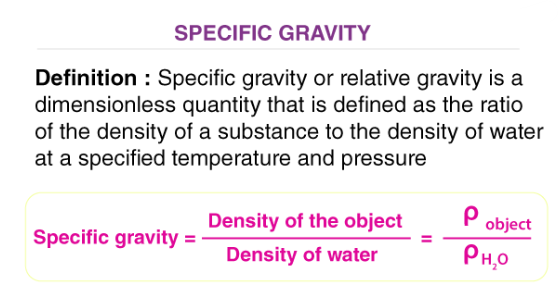

## 2. pH

1. Urine pH determines stone formation: Acidic urine leads to calcium oxalate and uric acid stones, while alkaline urine favors struvite stones.
2. pH imbalance promotes stone-forming substance precipitation, causing stone formation.
3. Urine pH affects stone dissolution: Alkaline urine dissolves uric acid stones, acidic urine dissolves calcium-based stones.
4. Monitoring pH is vital for assessing stone risk and treatment planning.
5. Lifestyle changes, diet, hydration, or medication may regulate pH to prevent stone formation or aid dissolution.


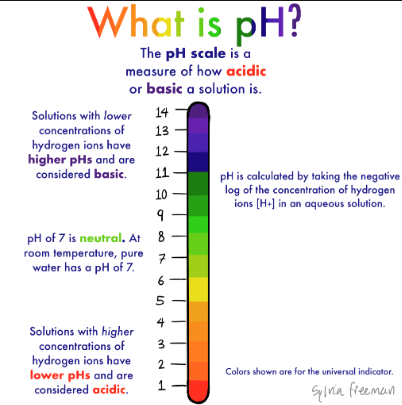

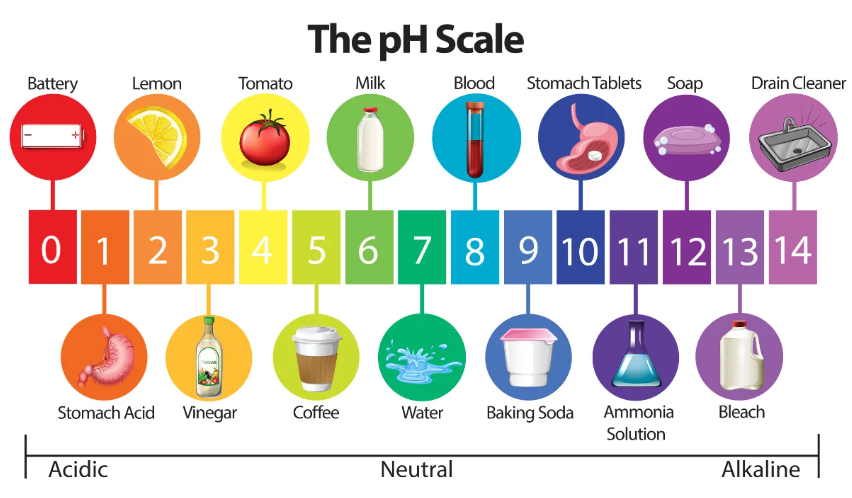


## 3. Osmolarity

**Urine osmolality**  is used to measure the number of dissolved particles per unit of water in the urine. As a measure of urine concentration, **it is more accurate than specific gravity**. Urine osmolality is useful in diagnosing disorders of urinary concentration such diabetes insipidous and in assessing hydration status. Often, the assessment of any disorder involving antidiuretic hormone (ADH) will require both serum and urine osmolality to assess concentrating ability of the kidney.

This test measures the concentration (osmolality) of particles in your urine. It finds out if your electrolyte balance is normal and if your kidneys are working as they should. Electrolytes are mineral salts that help move nutrients into your cells and move waste products out of your cells.

* Normal urine osmolality is as follows:

* 12- to 14-hour fluid restriction: >850 mOsm/kg H 2O (SI units)
* Random specimen: 50-1200 mOsm/kg H 2O, depending on fluid intake, or 50-1200 mmol/kg (SI units)

## 4. Conductivity in Kidneys

**Conductivity** in the context of kidneys refers to the ability of urine to conduct electricity. This property is primarily influenced by the concentration of ions dissolved in the urine, such as sodium, potassium, chloride, and other electrolytes.

- Measurement:

* Conductivity is typically measured using a conductivity meter, also known as a conductivity probe or conductivity sensor. This device measures the ability of a solution to conduct an electrical current. In the case of urine, the conductivity meter measures the conductivity of the urine sample, which reflects its ion concentration.

* If kidney stones are present, they can alter the composition of urine by increasing the concentration of certain ions and solutes, such as calcium, oxalate, uric acid, and phosphate. These substances contribute to higher conductivity in urine due to increased ion concentration.

* While specific numerical values for urinary conductivity can vary depending on the laboratory methods used and individual characteristics, a typical healthy range for urinary conductivity in adults might be around 3-7 mS/cm (millisiemens per centimeter) or 300-700 µS/cm (microsiemens per centimeter).

## 5. Concentration of Urea

- Urine urea nitrogen is a test that measures **the amount of urea in the urine**. Urea is a waste product resulting from the breakdown of protein in the body.

- This test is mainly used to check a person's protein balance and the amount of food protein needed by severely ill people. It is also used to determine how much protein a person takes in.

- Urea is excreted by the kidneys. The test measures the amount of urea the kidneys excrete. The result can show how well the kidneys are working.

- Normal values range from 12 to 20 grams per 24 hours (428.4 to 714 mmol/day).

## 6. Concentration of Calcium

* This test measures the amount of calcium in the urine. All cells need calcium in order to work. Calcium helps build strong bones and teeth. It is important for heart function, and helps with muscle contraction, nerve signaling, and blood clotting.

* Alternative Names: Urinary Ca+2; Kidney stones - calcium in urine; Renal calculi - calcium in your urine; Parathyroid - calcium in urine

**Note:** If you are eating a normal diet, the expected amount of calcium in the urine is 100 to 300 milligrams per day (mg/day) or 2.50 to 7.50 millimoles per 24 hours (mmol/24 hours). If you are eating a diet low in calcium, the amount of calcium in the urine will be 50 to 150 mg/day or 1.25 to 3.75 mmol/24 hours.

#### What Abnormal Results Mean
A high level of urine calcium (above 300 mg/day) may be due to:

* Chronic kidney disease
* High vitamin D level
* Leaking of calcium from the kidneys into the urine, which may cause calcium kidney stones
* Sarcoidosis
* Taking too much calcium
* Too much production of parathyroid hormone (PTH) by the parathyroid glands in the neck (hyperparathyroidism)
* Use of loop diuretics (most commonly furosemide, torsemide, or bumetanide)

# finding the Ratios between the columns: 

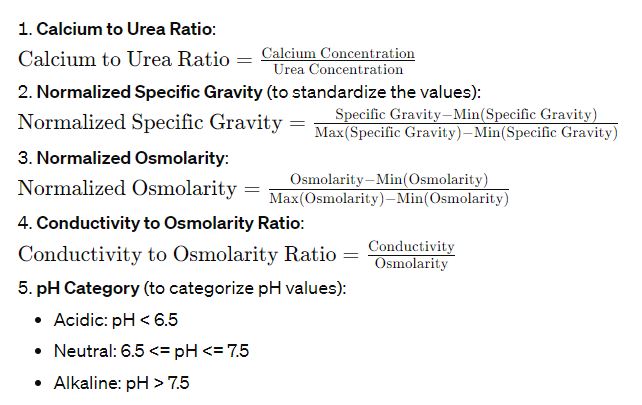


In [44]:
df1['Calc_Urea_ratio'] = df1['calcium_conc'] / df1['urea_conc']

In [45]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio
1,1,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169
2,2,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366
3,3,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598
4,4,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747
5,5,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254
...,...,...,...,...,...,...,...,...,...
12948,12948,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477
12949,12949,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189
12950,12950,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902
12951,12951,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034


In [46]:
df1['norm_spec_gravity'] = (df1['specific_gravity'] - df1['specific_gravity'].min()) / (df1['specific_gravity'].max() - df1['specific_gravity'].min())

In [47]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity
1,1,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169,0.03400
2,2,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366,0.01600
3,3,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598,0.02200
4,4,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747,0.01000
5,5,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254,0.04000
...,...,...,...,...,...,...,...,...,...,...
12948,12948,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.60000
12949,12949,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.15860
12950,12950,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.30600
12951,12951,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.41400


In [48]:
df1['norm_osmolarity'] = (df1['osmolarity'] - df1['osmolarity'].min()) / (df1['osmolarity'].max() - df1['osmolarity'].min())

In [49]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity
1,1,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169,0.03400,0.354464
2,2,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366,0.01600,0.125893
3,3,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598,0.02200,0.203571
4,4,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747,0.01000,0.00625
5,5,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254,0.04000,0.435714
...,...,...,...,...,...,...,...,...,...,...,...
12948,12948,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.60000,0.400893
12949,12949,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.15860,0.378571
12950,12950,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.30600,0.710714
12951,12951,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.41400,0.492857


In [50]:
df1['cond_to_osmo_ratio'] = df1['conductivity'] / df1['osmolarity']

In [51]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio
1,1,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169,0.03400,0.354464,0.034662
2,2,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366,0.01600,0.125893,0.046417
3,3,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598,0.02200,0.203571,0.030882
4,4,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747,0.01000,0.00625,0.040107
5,5,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254,0.04000,0.435714,0.037874
...,...,...,...,...,...,...,...,...,...,...,...,...
12948,12948,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.60000,0.400893,0.024324
12949,12949,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.15860,0.378571,0.058621
12950,12950,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.30600,0.710714,0.024331
12951,12951,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.41400,0.492857,0.033544


In [52]:
df1['pH Category'] = pd.cut(df1['pH'], bins=[-float("inf"), 6.5, 7.5, float("inf")], labels=['Acidic', 'Neutral', 'Alkaline'])


In [53]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
1,1,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169,0.03400,0.354464,0.034662,Acidic
2,2,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366,0.01600,0.125893,0.046417,Neutral
3,3,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598,0.02200,0.203571,0.030882,Acidic
4,4,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747,0.01000,0.00625,0.040107,Neutral
5,5,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254,0.04000,0.435714,0.037874,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12948,12948,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.60000,0.400893,0.024324,Acidic
12949,12949,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.15860,0.378571,0.058621,Neutral
12950,12950,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.30600,0.710714,0.024331,Acidic
12951,12951,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.41400,0.492857,0.033544,Acidic


In [54]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12952 entries, 1 to 12952
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   index               12952 non-null  Int64   
 1   specific_gravity    12952 non-null  float64 
 2   pH                  12952 non-null  float64 
 3   osmolarity          12952 non-null  Int64   
 4   conductivity        12952 non-null  float64 
 5   urea_conc           12952 non-null  Int64   
 6   calcium_conc        12952 non-null  float64 
 7   target              12952 non-null  object  
 8   Calc_Urea_ratio     12952 non-null  Float64 
 9   norm_spec_gravity   12952 non-null  float64 
 10  norm_osmolarity     12952 non-null  Float64 
 11  cond_to_osmo_ratio  12952 non-null  Float64 
 12  pH Category         12952 non-null  category
dtypes: Float64(3), Int64(3), category(1), float64(5), object(1)
memory usage: 1.3+ MB


In [55]:
df1.reset_index(drop=True, inplace=True)

In [56]:
df1

,index,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
0,1,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169,0.03400,0.354464,0.034662,Acidic
1,2,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366,0.01600,0.125893,0.046417,Neutral
2,3,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598,0.02200,0.203571,0.030882,Acidic
3,4,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747,0.01000,0.00625,0.040107,Neutral
4,5,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254,0.04000,0.435714,0.037874,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12947,12948,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.60000,0.400893,0.024324,Acidic
12948,12949,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.15860,0.378571,0.058621,Neutral
12949,12950,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.30600,0.710714,0.024331,Acidic
12950,12951,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.41400,0.492857,0.033544,Acidic


In [57]:
df1.drop('index', axis = 1, inplace=True)

In [58]:
df2 = df1.copy()

In [59]:
df2

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
0,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169,0.03400,0.354464,0.034662,Acidic
1,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366,0.01600,0.125893,0.046417,Neutral
2,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598,0.02200,0.203571,0.030882,Acidic
3,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747,0.01000,0.00625,0.040107,Neutral
4,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254,0.04000,0.435714,0.037874,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...
12947,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.60000,0.400893,0.024324,Acidic
12948,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.15860,0.378571,0.058621,Neutral
12949,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.30600,0.710714,0.024331,Acidic
12950,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.41400,0.492857,0.033544,Acidic


In [60]:
df2.to_csv(r"D:\Ashfaq Khan\Documents\Project submission folder\EDA_kidney_stone.csv")

In [61]:
df2.head(10)

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
0,1.017,5.74,577,20.0,296,4.49,0,0.015169,0.034,0.354464,0.034662,Acidic
1,1.008,7.20,321,14.9,101,2.36,0,0.023366,0.016,0.125893,0.046417,Neutral
2,1.011,5.51,408,12.6,224,2.15,0,0.009598,0.022,0.203571,0.030882,Acidic
3,1.005,6.52,187,7.5,91,1.16,0,0.012747,0.010,0.00625,0.040107,Neutral
4,1.020,5.27,668,25.3,252,3.34,0,0.013254,0.040,0.435714,0.037874,Acidic
5,1.012,5.62,461,17.4,195,1.40,0,0.007179,0.024,0.250893,0.037744,Acidic
6,1.029,5.67,1107,35.9,550,8.48,0,0.015418,0.058,0.827679,0.03243,Acidic
7,1.015,5.41,543,21.9,170,1.16,0,0.006824,0.030,0.324107,0.040331,Acidic
8,1.021,6.13,779,25.7,382,2.21,0,0.005785,0.042,0.534821,0.032991,Acidic
9,1.011,6.19,345,11.5,152,1.93,0,0.012697,0.022,0.147321,0.033333,Acidic


In [62]:
df2.tail(10)

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
12942,1.460000,7.309638,186,28.339388,519,7.780,0,0.01499,0.920000,0.005357,0.152362,Neutral
12943,1.483422,5.720953,377,5.300000,304,0.826,1,0.002717,0.966843,0.175893,0.014058,Acidic
12944,1.310000,6.830000,217,28.760400,594,5.300,1,0.008923,0.620000,0.033036,0.132536,Neutral
12945,1.291996,5.728480,648,6.971000,166,11.378,1,0.068542,0.583992,0.417857,0.010758,Acidic
12946,1.146000,7.356960,246,25.462883,220,1.150,0,0.005227,0.292000,0.058929,0.103508,Neutral
12947,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.600000,0.400893,0.024324,Acidic
12948,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.158600,0.378571,0.058621,Neutral
12949,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.306000,0.710714,0.024331,Acidic
12950,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.414000,0.492857,0.033544,Acidic
12951,1.071655,7.740000,1097,14.561080,161,4.676,1,0.029043,0.143310,0.81875,0.013274,Alkaline


# Non-visual analysis

In [63]:
df2[(df2['calcium_conc'] == df2['calcium_conc'].max()) & (df2['target'] == "1")][['target','calcium_conc']]

,target,calcium_conc
45,1,13.0
1976,1,13.0
3096,1,13.0
3444,1,13.0
3565,1,13.0
4994,1,13.0
5013,1,13.0
7250,1,13.0
7504,1,13.0
7999,1,13.0


In [64]:
df2[(df2['calcium_conc'] == df2['calcium_conc'].max()) & (df2['target'] == "0")][['target','calcium_conc']]

,target,calcium_conc
822,0,13.0
1917,0,13.0
4592,0,13.0
5883,0,13.0
8487,0,13.0
10822,0,13.0
11223,0,13.0
12032,0,13.0
12881,0,13.0


In [65]:
df2[(df2['calcium_conc'] == df2['calcium_conc'].min()) & (df2['target'] == "1")][['target','calcium_conc']]

,target,calcium_conc
422,1,0.1
578,1,0.1
1088,1,0.1
3952,1,0.1
6506,1,0.1
8012,1,0.1
8816,1,0.1
9309,1,0.1
10777,1,0.1
12551,1,0.1


In [66]:
df2[(df2['pH'] == df2['pH'].max()) & (df2['target'] == "1")][['target','pH']]

,target,pH
55,1,7.94


In [67]:
df2[(df2['pH'] == df2['pH'].min()) & (df2['target'] == "1")][['target','pH']]

,target,pH
1611,1,4.7
2107,1,4.7
2557,1,4.7
2805,1,4.7
3351,1,4.7
3574,1,4.7
3901,1,4.7
3936,1,4.7
6624,1,4.7
7012,1,4.7


In [68]:
df2[(df2['pH'] == df2['pH'].min()) & (df2['target'] == "0")][['target','pH']]

,target,pH
887,0,4.7
3071,0,4.7
3872,0,4.7
3894,0,4.7
3946,0,4.7
6110,0,4.7
6647,0,4.7
6830,0,4.7
9567,0,4.7
10884,0,4.7


In [69]:
df2[(df2['specific_gravity'] > 1.030) & (df2['target'] == "1")][['target', 'specific_gravity']]

,target,specific_gravity
54,1,1.031000
59,1,1.034000
60,1,1.033000
86,1,1.032754
90,1,1.486000
...,...,...
12943,1,1.483422
12944,1,1.310000
12945,1,1.291996
12948,1,1.079300


In [70]:
df2[(df2['osmolarity'] >= 50) & (df2['osmolarity'] <= 1200) & (df2['target'] == "1")][['target', 'osmolarity']]


,target,osmolarity
44,1,774
45,1,698
46,1,866
47,1,775
48,1,853
...,...,...
12943,1,377
12944,1,217
12945,1,648
12948,1,604


In [71]:
df2[(df2['osmolarity'] >= 50) & (df2['osmolarity'] <= 1200) & (df2['target'] == "0")][['target', 'osmolarity']]

,target,osmolarity
0,0,577
1,0,321
2,0,408
3,0,187
4,0,668
...,...,...
12942,0,186
12946,0,246
12947,0,629
12949,0,976


In [72]:
df2[df2['target'] == "0"]  # No stone



,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
0,1.017,5.740000,577,20.000000,296,4.490,0,0.015169,0.034,0.354464,0.034662,Acidic
1,1.008,7.200000,321,14.900000,101,2.360,0,0.023366,0.016,0.125893,0.046417,Neutral
2,1.011,5.510000,408,12.600000,224,2.150,0,0.009598,0.022,0.203571,0.030882,Acidic
3,1.005,6.520000,187,7.500000,91,1.160,0,0.012747,0.010,0.00625,0.040107,Neutral
4,1.020,5.270000,668,25.300000,252,3.340,0,0.013254,0.040,0.435714,0.037874,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...
12942,1.460,7.309638,186,28.339388,519,7.780,0,0.01499,0.920,0.005357,0.152362,Neutral
12946,1.146,7.356960,246,25.462883,220,1.150,0,0.005227,0.292,0.058929,0.103508,Neutral
12947,1.300,5.800000,629,15.300000,522,8.079,0,0.015477,0.600,0.400893,0.024324,Acidic
12949,1.153,5.300000,976,23.746660,510,9.700,0,0.01902,0.306,0.710714,0.024331,Acidic


In [73]:
df2[df2['target'] == "1"]  # Stone present

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
44,1.021000,5.940000,774,27.900000,325,6.960,1,0.021415,0.042000,0.530357,0.036047,Acidic
45,1.024000,5.770000,698,19.500000,354,13.000,1,0.036723,0.048000,0.4625,0.027937,Acidic
46,1.024000,5.600000,866,29.500000,360,5.540,1,0.015389,0.048000,0.6125,0.034065,Acidic
47,1.021000,5.530000,775,31.200000,302,6.190,1,0.020497,0.042000,0.53125,0.040258,Acidic
48,1.024000,5.360000,853,27.600000,364,7.310,1,0.020082,0.048000,0.600893,0.032356,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...
12943,1.483422,5.720953,377,5.300000,304,0.826,1,0.002717,0.966843,0.175893,0.014058,Acidic
12944,1.310000,6.830000,217,28.760400,594,5.300,1,0.008923,0.620000,0.033036,0.132536,Neutral
12945,1.291996,5.728480,648,6.971000,166,11.378,1,0.068542,0.583992,0.417857,0.010758,Acidic
12948,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.158600,0.378571,0.058621,Neutral


In [74]:
# High specific gravity may indicate concentrated urine
df2[df2['specific_gravity'] > 1.030]


,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
54,1.031000,5.730000,874,17.400000,516,3.010000,1,0.005833,0.062000,0.619643,0.019908,Acidic
59,1.034000,5.240000,1236,27.300000,620,12.680000,1,0.020452,0.068000,0.942857,0.022087,Acidic
60,1.033000,5.580000,1032,29.100000,430,8.940000,1,0.020791,0.066000,0.760714,0.028198,Acidic
86,1.032754,5.443491,1085,23.188653,576,8.664169,1,0.015042,0.065508,0.808036,0.021372,Acidic
89,1.244000,4.772600,954,13.400000,136,4.800000,0,0.035294,0.488000,0.691071,0.014046,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...
12947,1.300000,5.800000,629,15.300000,522,8.079000,0,0.015477,0.600000,0.400893,0.024324,Acidic
12948,1.079300,7.312698,604,35.406956,339,1.081000,1,0.003189,0.158600,0.378571,0.058621,Neutral
12949,1.153000,5.300000,976,23.746660,510,9.700000,0,0.01902,0.306000,0.710714,0.024331,Acidic
12950,1.207000,6.125543,732,24.554000,382,0.130000,0,0.00034,0.414000,0.492857,0.033544,Acidic


In [75]:
# Low pH may indicate acidic urine
df2[df2['pH'] < 5.5]


,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
4,1.020000,5.270000,668,25.30000,252,3.340,0,0.013254,0.040000,0.435714,0.037874,Acidic
7,1.015000,5.410000,543,21.90000,170,1.160,0,0.006824,0.030000,0.324107,0.040331,Acidic
12,1.007000,5.350000,283,9.90000,147,1.470,0,0.01,0.014000,0.091964,0.034982,Acidic
13,1.011000,5.210000,450,17.90000,161,1.530,0,0.009503,0.022000,0.241071,0.039778,Acidic
14,1.018000,4.900000,684,26.10000,284,5.090,0,0.017923,0.036000,0.45,0.038158,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...
12922,1.024370,5.063096,663,23.97298,574,8.220,1,0.014321,0.048740,0.43125,0.036158,Acidic
12925,1.409464,5.260000,293,35.76000,380,2.925,1,0.007697,0.818928,0.100893,0.122048,Acidic
12933,1.233000,5.491828,1121,37.06352,163,6.760,1,0.041472,0.466000,0.840179,0.033063,Acidic
12941,1.439670,5.459530,1169,36.10000,548,11.109,1,0.020272,0.879340,0.883036,0.030881,Acidic


In [76]:
# High osmolarity may indicate concentrated urine
df2[(df2['osmolarity'] >= 50) & (df2['osmolarity'] <= 1200)]


,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
0,1.017000,5.740000,577,20.000000,296,4.490,0,0.015169,0.03400,0.354464,0.034662,Acidic
1,1.008000,7.200000,321,14.900000,101,2.360,0,0.023366,0.01600,0.125893,0.046417,Neutral
2,1.011000,5.510000,408,12.600000,224,2.150,0,0.009598,0.02200,0.203571,0.030882,Acidic
3,1.005000,6.520000,187,7.500000,91,1.160,0,0.012747,0.01000,0.00625,0.040107,Neutral
4,1.020000,5.270000,668,25.300000,252,3.340,0,0.013254,0.04000,0.435714,0.037874,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...
12947,1.300000,5.800000,629,15.300000,522,8.079,0,0.015477,0.60000,0.400893,0.024324,Acidic
12948,1.079300,7.312698,604,35.406956,339,1.081,1,0.003189,0.15860,0.378571,0.058621,Neutral
12949,1.153000,5.300000,976,23.746660,510,9.700,0,0.01902,0.30600,0.710714,0.024331,Acidic
12950,1.207000,6.125543,732,24.554000,382,0.130,0,0.00034,0.41400,0.492857,0.033544,Acidic


In [77]:
# Differentiate based on pH category (e.g., acidic, neutral, alkaline)
df2[df2['pH Category'] == "Acidic"]


,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
0,1.017000,5.740000,577,20.00000,296,4.490,0,0.015169,0.034000,0.354464,0.034662,Acidic
2,1.011000,5.510000,408,12.60000,224,2.150,0,0.009598,0.022000,0.203571,0.030882,Acidic
4,1.020000,5.270000,668,25.30000,252,3.340,0,0.013254,0.040000,0.435714,0.037874,Acidic
5,1.012000,5.620000,461,17.40000,195,1.400,0,0.007179,0.024000,0.250893,0.037744,Acidic
6,1.029000,5.670000,1107,35.90000,550,8.480,0,0.015418,0.058000,0.827679,0.03243,Acidic
...,...,...,...,...,...,...,...,...,...,...,...,...
12943,1.483422,5.720953,377,5.30000,304,0.826,1,0.002717,0.966843,0.175893,0.014058,Acidic
12945,1.291996,5.728480,648,6.97100,166,11.378,1,0.068542,0.583992,0.417857,0.010758,Acidic
12947,1.300000,5.800000,629,15.30000,522,8.079,0,0.015477,0.600000,0.400893,0.024324,Acidic
12949,1.153000,5.300000,976,23.74666,510,9.700,0,0.01902,0.306000,0.710714,0.024331,Acidic


In [78]:
df2[df2['pH Category'] == "Neutral"]



,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
1,1.0080,7.200000,321,14.900000,101,2.360,0,0.023366,0.0160,0.125893,0.046417,Neutral
3,1.0050,6.520000,187,7.500000,91,1.160,0,0.012747,0.0100,0.00625,0.040107,Neutral
11,1.0060,7.120000,242,11.300000,64,1.030,0,0.016094,0.0120,0.055357,0.046694,Neutral
15,1.0070,6.630000,253,8.400000,133,1.050,0,0.007895,0.0140,0.065179,0.033202,Neutral
16,1.0250,6.810000,947,32.600000,395,2.030,0,0.005139,0.0500,0.684821,0.034424,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...
12937,1.4300,6.563000,570,10.328610,561,6.220,0,0.011087,0.8600,0.348214,0.01812,Neutral
12942,1.4600,7.309638,186,28.339388,519,7.780,0,0.01499,0.9200,0.005357,0.152362,Neutral
12944,1.3100,6.830000,217,28.760400,594,5.300,1,0.008923,0.6200,0.033036,0.132536,Neutral
12946,1.1460,7.356960,246,25.462883,220,1.150,0,0.005227,0.2920,0.058929,0.103508,Neutral


In [79]:
df2[df2['pH Category'] == "Alkaline"]

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,target,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio,pH Category
25,1.017000,7.610000,527,25.800000,75,2.170,0,0.028933,0.034000,0.309821,0.048956,Alkaline
29,1.017000,7.920000,680,25.300000,282,1.060,0,0.003759,0.034000,0.446429,0.037206,Alkaline
55,1.020000,7.940000,567,19.700000,212,6.810,1,0.032123,0.040000,0.345536,0.034744,Alkaline
71,1.025000,7.900000,721,23.600000,301,9.040,1,0.030033,0.050000,0.483036,0.032732,Alkaline
93,1.200000,7.800000,1193,23.236000,302,10.080,1,0.033377,0.400000,0.904464,0.019477,Alkaline
...,...,...,...,...,...,...,...,...,...,...,...,...
12916,1.388124,7.762442,1089,9.337000,242,3.840,1,0.015868,0.776249,0.811607,0.008574,Alkaline
12928,1.023963,7.592498,1086,23.717518,446,6.656,1,0.014924,0.047926,0.808929,0.021839,Alkaline
12939,1.060000,7.600000,1036,8.622458,384,4.400,1,0.011458,0.120000,0.764286,0.008323,Alkaline
12940,1.090000,7.570000,1083,6.588400,448,2.000,0,0.004464,0.180000,0.80625,0.006083,Alkaline


# Uni-Variate Analysis

In [80]:
# Descriptive Statistics
df2.describe()

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio
count,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000,12952.000000
mean,1.250389,6.303978,738.823579,21.555918,314.999228,6.531522,0.044661,0.500777,0.498950,0.038135
std,0.146063,0.921753,323.426325,9.590611,175.758683,3.743856,0.089197,0.292126,0.288774,0.030600
min,1.000000,4.700000,180.000000,5.100000,10.000000,0.100000,0.000162,0.000000,0.000000,0.004002
25%,1.120000,5.500000,460.750000,13.134910,163.000000,3.300000,0.010500,0.240000,0.250670,0.017863
50%,1.250581,6.301557,736.000000,21.694232,314.000000,6.498000,0.020486,0.501162,0.496429,0.029291
75%,1.381300,7.100000,1020.000000,29.865044,466.000000,9.800000,0.039461,0.762600,0.750000,0.047231
max,1.500000,7.940000,1300.000000,38.000000,620.000000,13.000000,1.288500,1.000000,1.000000,0.208729


In [81]:
# Value Counts
print(df2['target'].value_counts())

1    6486
0    6466
Name: target, dtype: int64


In [82]:
df2['pH Category'].value_counts()

Acidic      7303
Neutral     4063
Alkaline    1586
Name: pH Category, dtype: int64

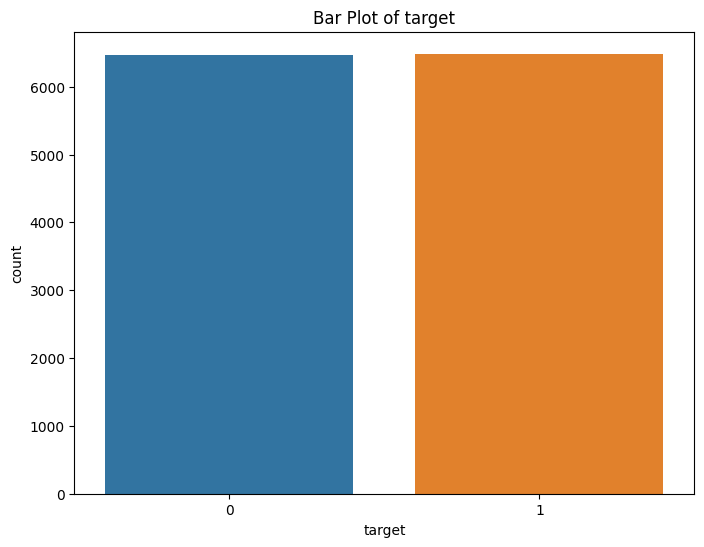

In [83]:
# Bar Plots
for column in df2.select_dtypes(include='object'):
    plt.figure(figsize=(8, 6))
    sns.countplot(data=df2, x=column)
    plt.title(f'Bar Plot of {column}')
    plt.show()


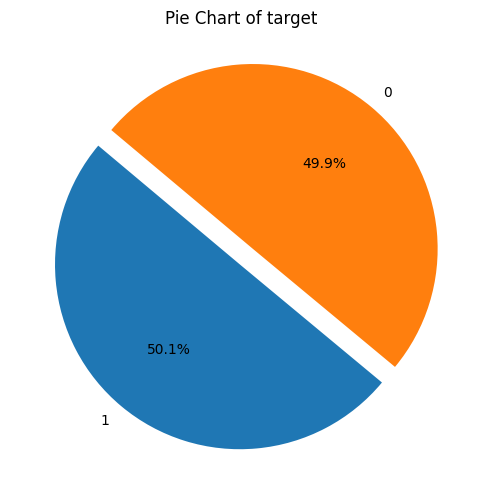

In [84]:
# Pie Charts
for column in df2.select_dtypes(include='object'):
    plt.figure(figsize=(8, 6))
    counts = df2[column].value_counts()
    plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140,explode=[0.01,0.1])
    plt.title(f'Pie Chart of {column}')
    plt.show()


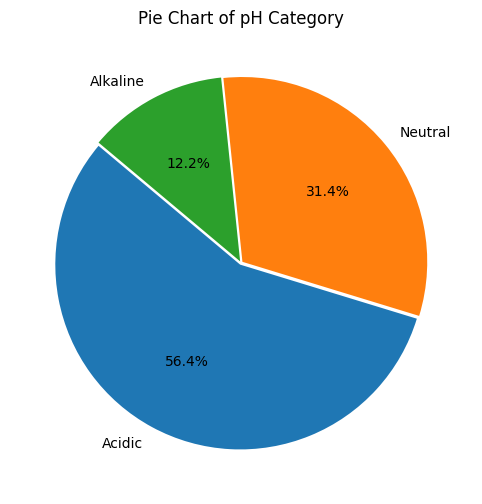

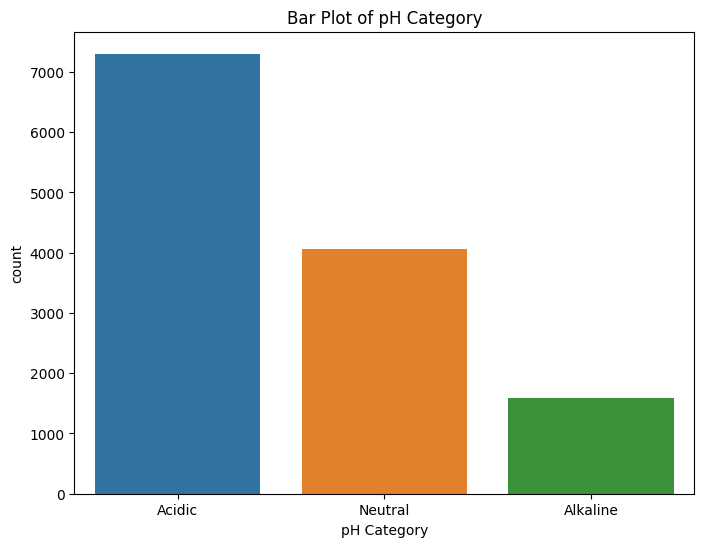

In [85]:
# Pie Chart for 'pH Category'
plt.figure(figsize=(8, 6))
counts = df2['pH Category'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140, explode=[0.01] * len(counts))
plt.title('Pie Chart of pH Category')
plt.show()

# Bar Plot for 'pH Category'
plt.figure(figsize=(8, 6))
sns.countplot(data=df2, x='pH Category')
plt.title('Bar Plot of pH Category')
plt.show()

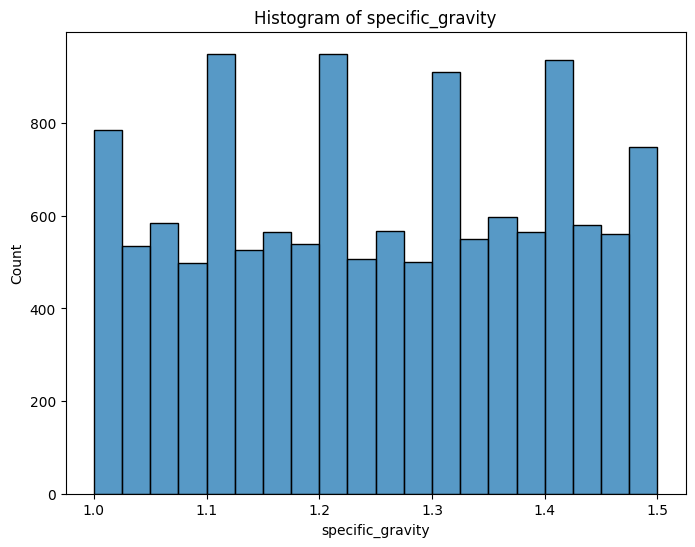

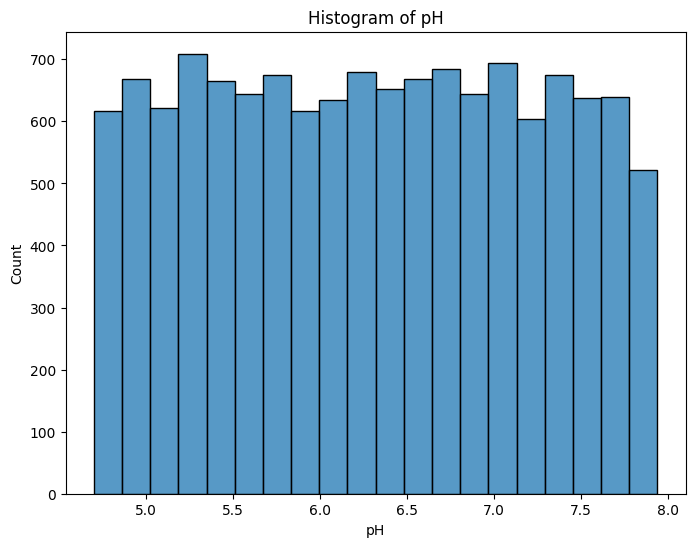

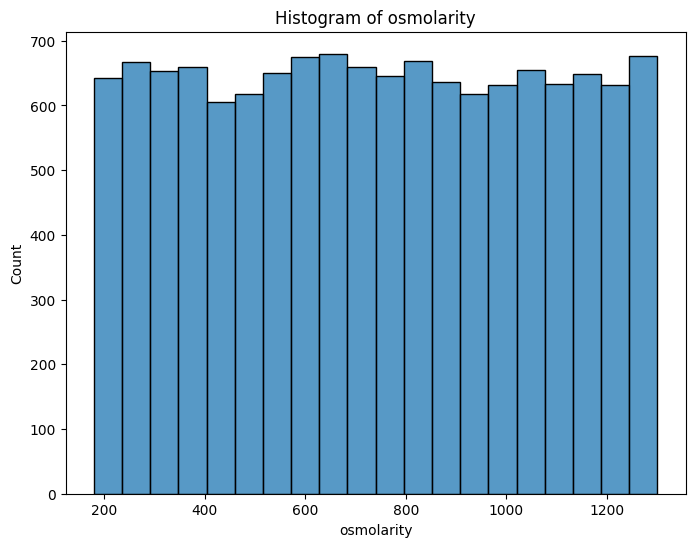

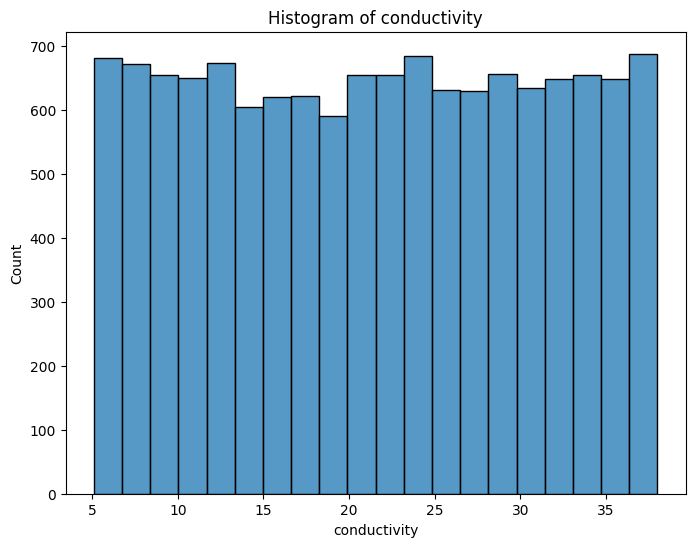

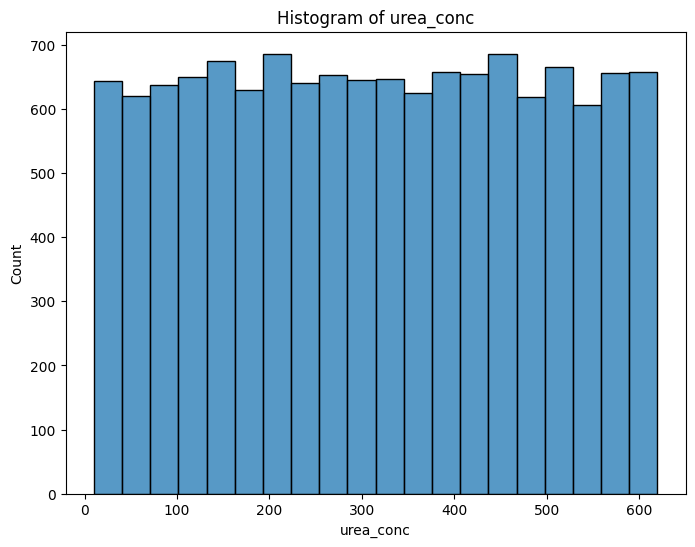

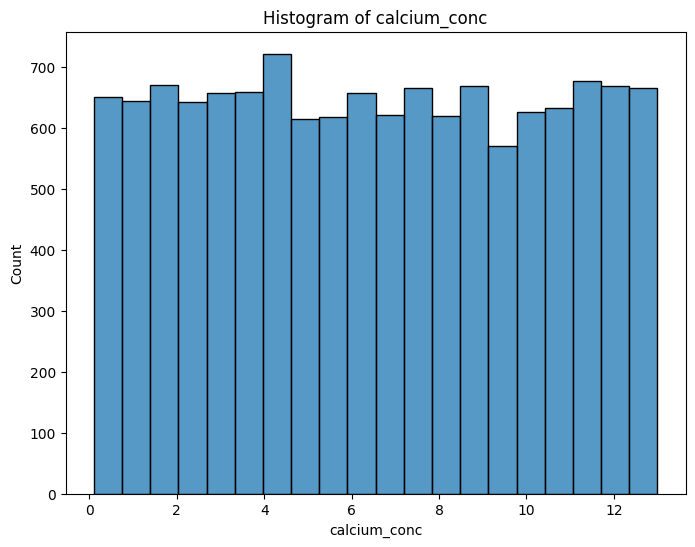

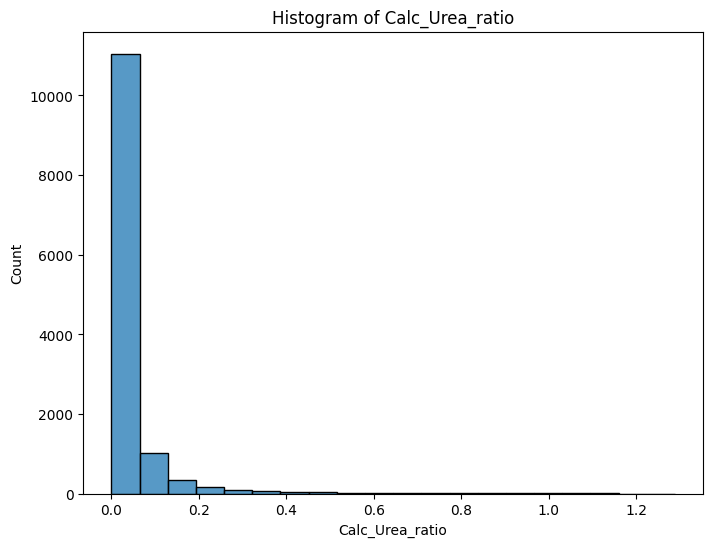

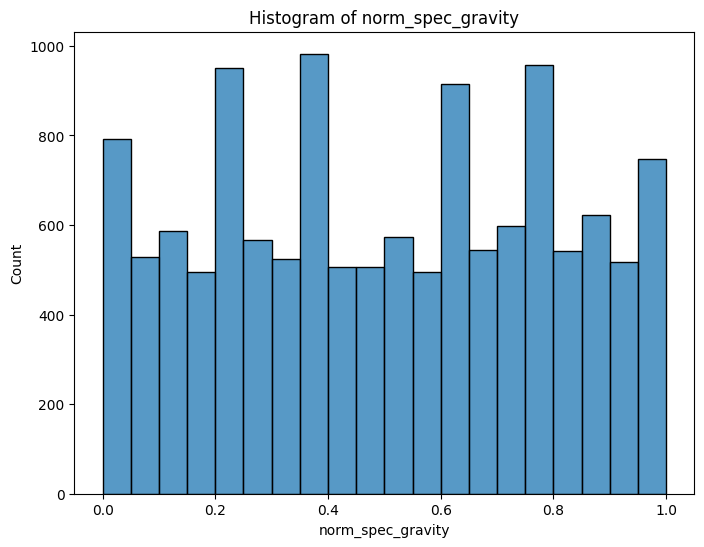

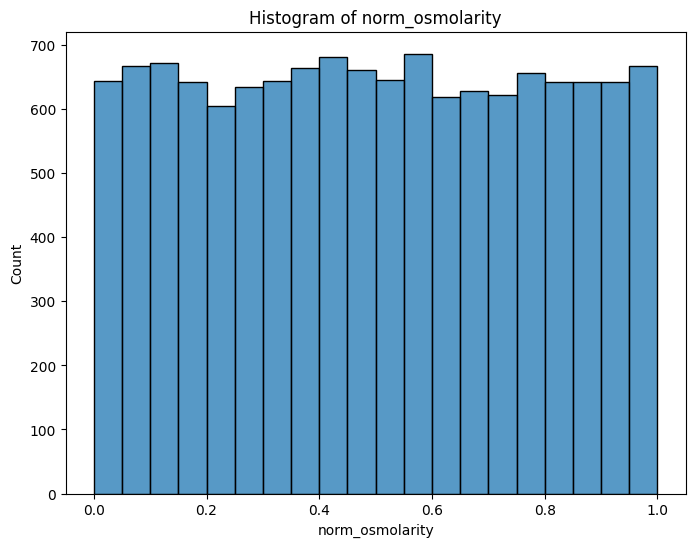

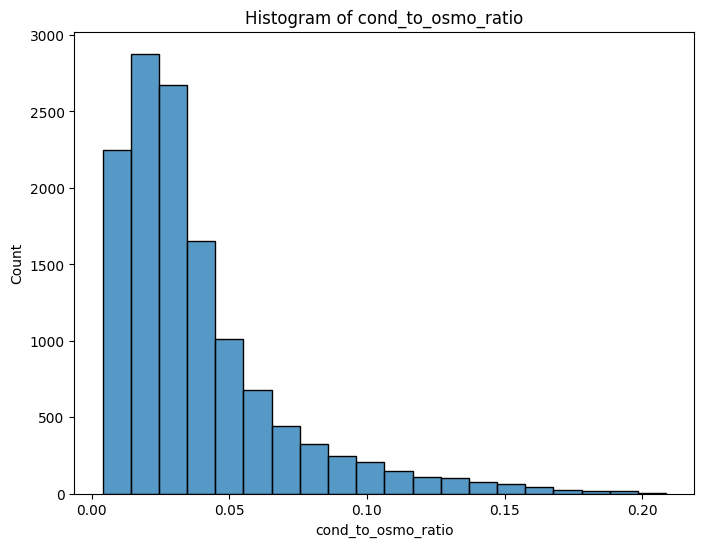

In [86]:
# Histograms with adjusted bin sizes
for column in df2.select_dtypes(include='number'):
    plt.figure(figsize=(8, 6))
    sns.histplot(data=df2, x=column, bins=20)  # Adjust the number of bins as needed
    plt.title(f'Histogram of {column}')
    plt.show()


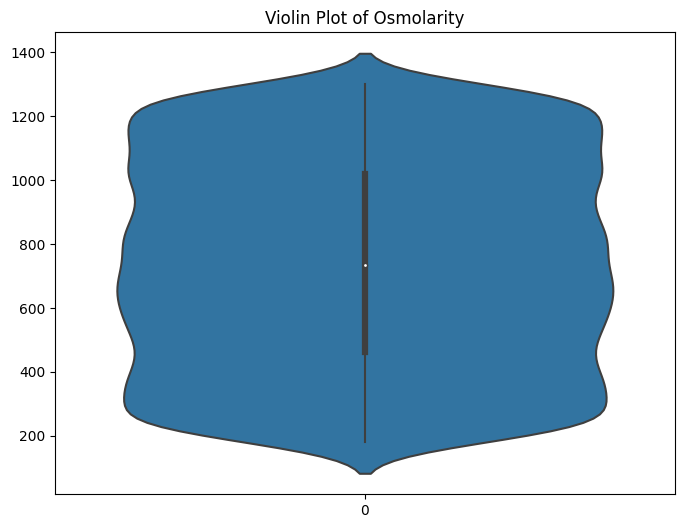

In [87]:
plt.figure(figsize=(8, 6))
sns.violinplot(data=df2['osmolarity'])
plt.title('Violin Plot of Osmolarity')
plt.show()


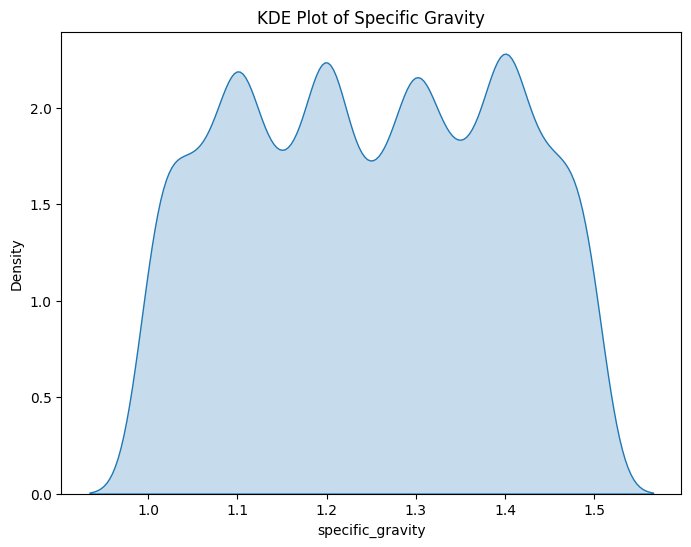

In [88]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df2['specific_gravity'].astype(float), shade=True)
plt.title('KDE Plot of Specific Gravity')
plt.show()


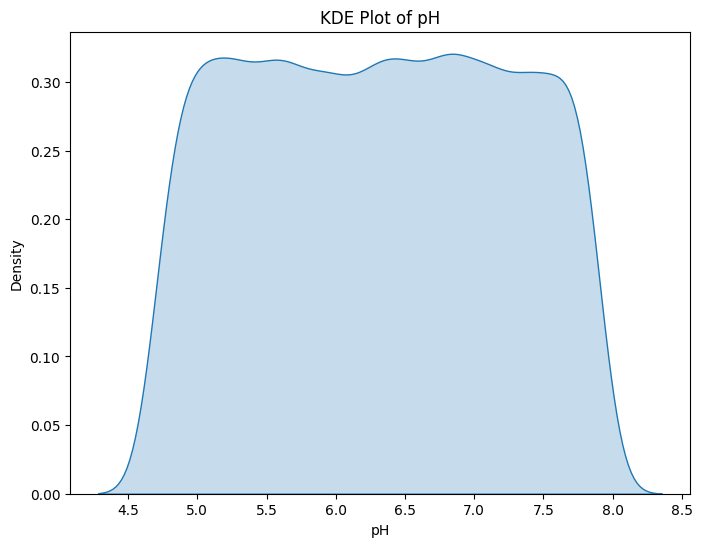

In [89]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df2['pH'].astype(float), shade=True)
plt.title('KDE Plot of pH')
plt.show()


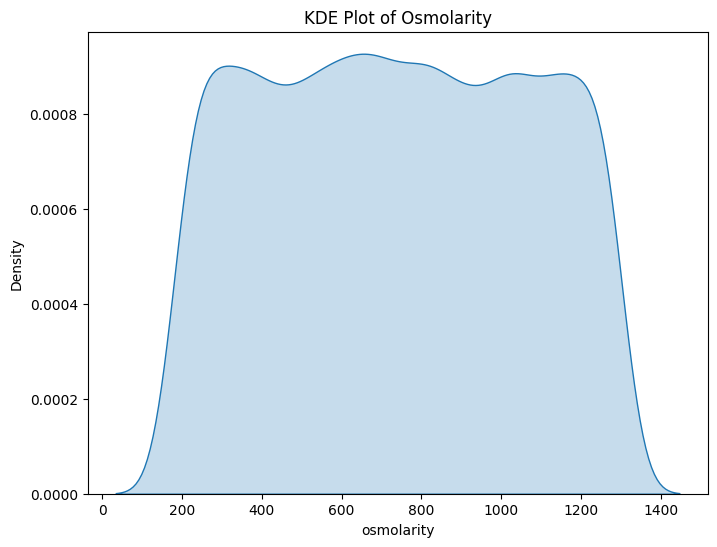

In [90]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df2['osmolarity'].astype(float), shade=True)
plt.title('KDE Plot of Osmolarity')
plt.show()


* we see the density of osmolarity.
* from the above, we see the more density is present at 200 and 400

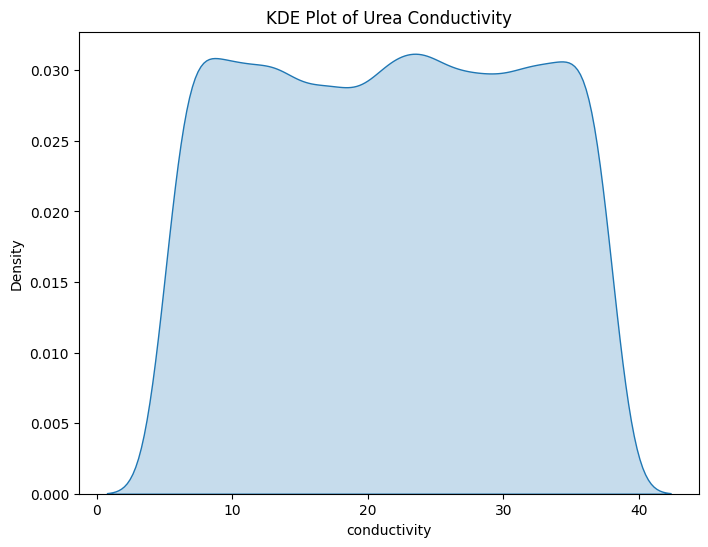

In [91]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df2['conductivity'].astype(float), shade=True)
plt.title('KDE Plot of Urea Conductivity')
plt.show()


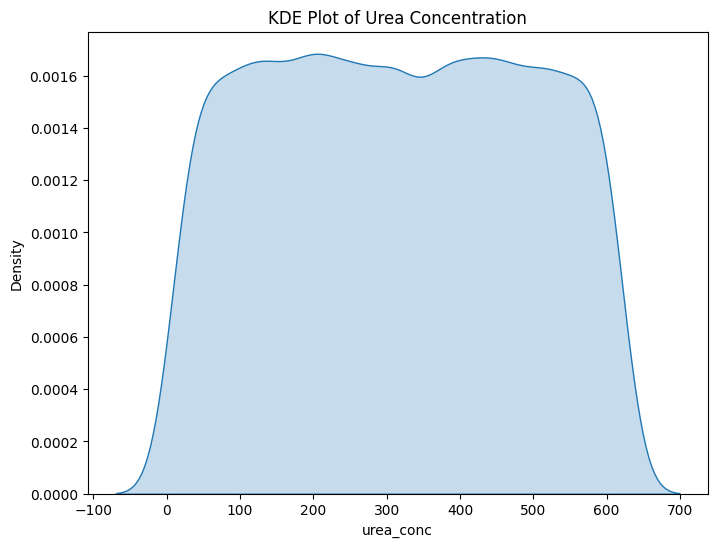

In [92]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df2['urea_conc'].astype(float), shade=True)
plt.title('KDE Plot of Urea Concentration')
plt.show()


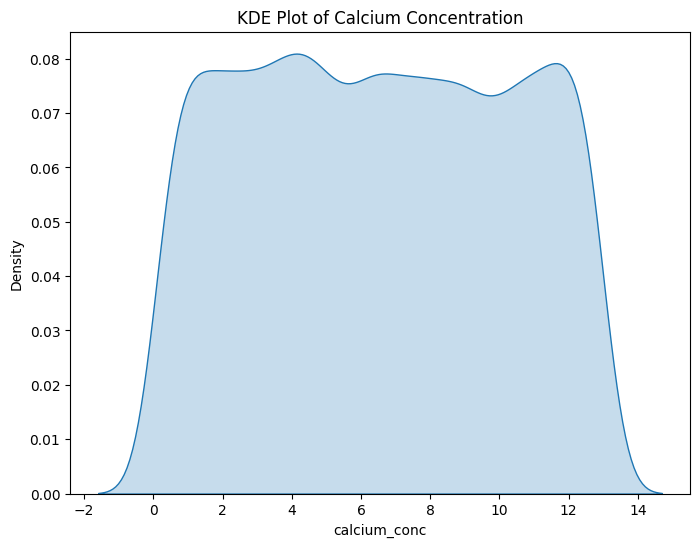

In [93]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=df2['calcium_conc'].astype(float), shade=True)
plt.title('KDE Plot of Calcium Concentration')
plt.show()


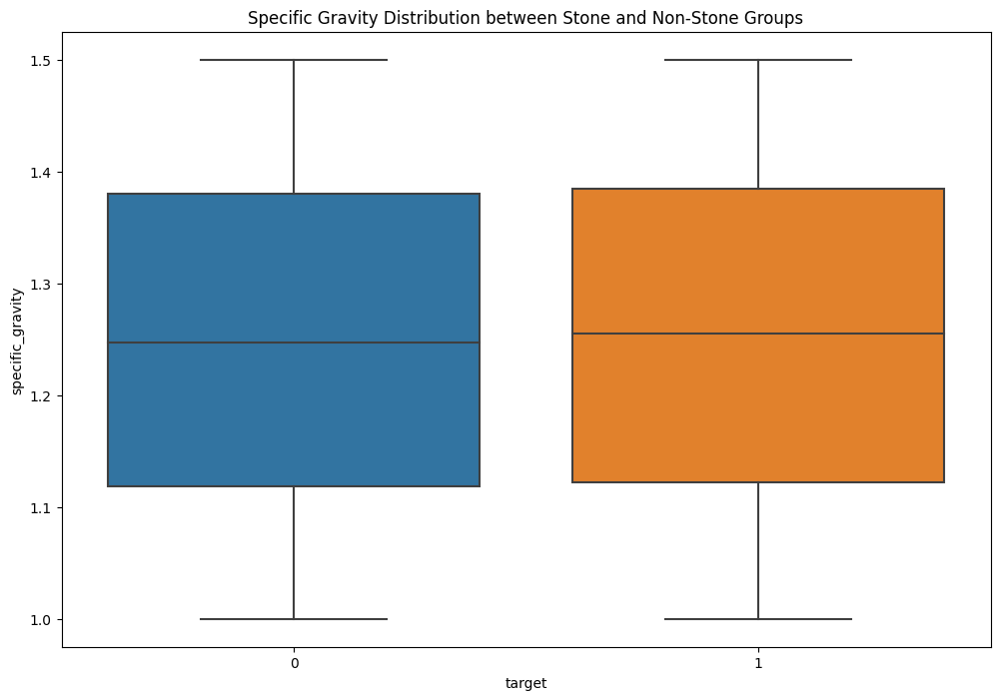

In [94]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.boxplot(x='target', y='specific_gravity', data=df2)
plt.title('Specific Gravity Distribution between Stone and Non-Stone Groups')
plt.show()


# Bi-Variate Analysis

In [95]:
df2.columns

Index(['specific_gravity', 'pH', 'osmolarity', 'conductivity', 'urea_conc',
       'calcium_conc', 'target', 'Calc_Urea_ratio', 'norm_spec_gravity',
       'norm_osmolarity', 'cond_to_osmo_ratio', 'pH Category'],
      dtype='object')

In [96]:
correlation_matrix = df2.select_dtypes(include='number').corr()

# Convert correlation matrix to DataFrame
correlation_df = pd.DataFrame(correlation_matrix)

# Print the correlation DataFrame
correlation_df

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio
specific_gravity,1.000000,0.014737,0.003989,-0.001653,0.000162,0.016934,0.003554,1.000000,0.003989,-0.005134
pH,0.014737,1.000000,-0.007081,-0.002142,0.021629,0.002478,0.001247,0.014737,-0.007081,0.005256
osmolarity,0.003989,-0.007081,1.000000,-0.002253,0.004151,0.006670,-0.004600,0.003989,1.000000,-0.668848
conductivity,-0.001653,-0.002142,-0.002253,1.000000,0.004472,-0.002927,-0.000650,-0.001653,-0.002253,0.555933
urea_conc,0.000162,0.021629,0.004151,0.004472,1.000000,0.015820,-0.480789,0.000162,0.004151,0.003729
calcium_conc,0.016934,0.002478,0.006670,-0.002927,0.015820,1.000000,0.291889,0.016934,0.006670,-0.004957
Calc_Urea_ratio,0.003554,0.001247,-0.004600,-0.000650,-0.480789,0.291889,1.000000,0.003554,-0.004600,0.005117
norm_spec_gravity,1.000000,0.014737,0.003989,-0.001653,0.000162,0.016934,0.003554,1.000000,0.003989,-0.005134
norm_osmolarity,0.003989,-0.007081,1.000000,-0.002253,0.004151,0.006670,-0.004600,0.003989,1.000000,-0.668848
cond_to_osmo_ratio,-0.005134,0.005256,-0.668848,0.555933,0.003729,-0.004957,0.005117,-0.005134,-0.668848,1.000000


A correlation matrix is a table that shows the correlation coefficients between many variables. Each cell in the table represents the correlation coefficient between two variables. 

The correlation coefficient is a statistical measure that describes the strength and direction of a relationship between two variables. It ranges from -1 to 1:

- A correlation coefficient of 1 indicates a perfect positive correlation, meaning that as one variable increases, the other variable also increases.
- A correlation coefficient of -1 indicates a perfect negative correlation, meaning that as one variable increases, the other variable decreases.
- A correlation coefficient of 0 indicates no linear relationship between the variables.



In [97]:
summary_stats = df2.groupby('pH Category').agg({
    'specific_gravity': ['mean', 'median', 'std'],  # Replace 'specific_gravity' with other column names
    'pH': ['mean', 'median', 'std'],
    'osmolarity': ['mean', 'median', 'std'],
    'conductivity': ['mean', 'median', 'std'],
    'urea_conc': ['mean', 'median', 'std'],
    'calcium_conc': ['mean', 'median', 'std']
})
pd.DataFrame(summary_stats)


specific_gravity                            pH            \
                        mean    median       std      mean    median   
pH Category                                                            
Acidic              1.249338  1.250000  0.146121  5.608269  5.600000   
Neutral             1.250852  1.251500  0.146491  7.006445  7.000000   
Alkaline            1.254037  1.252497  0.144718  7.707913  7.705074   

                       osmolarity                    conductivity             \
                  std        mean median         std         mean     median   
pH Category                                                                    
Acidic       0.520851  738.835821  736.0  323.985306    21.576423  21.615126   
Neutral      0.287775  743.316023  742.0  322.145585    21.465775  21.668503   
Alkaline     0.113714  727.258512  719.5  324.041244    21.692423  22.073350   

                        urea_conc                    calcium_conc         \
                  std        mean median         std         mean median   
pH Category                                                                
Acidic       9.538402  311.521156  308.0  175.924805     6.519457   6.48   
Neutral      9.722399  317.919518  322.0  175.508903     6.491532   6.40   
Alkaline     9.493825  323.533417  324.0  175.314936     6.689520   6.74   

                       
                  std  
pH Category            
Acidic       3.767915  
Neutral      3.722589  
Alkaline     3.684932

In [98]:
df2.groupby('target').mean()


,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio
target,,,,,,,,,,
0,1.248026,6.30528,734.925147,21.626923,312.714816,6.513044,0.044767,0.496053,0.495469,0.038222
1,1.252743,6.30268,742.709991,21.485132,317.276596,6.549942,0.044556,0.505487,0.50242,0.038048


In [99]:
summary_stats = df2.groupby('pH Category').agg({
    'Calc_Urea_ratio': ['mean', 'median', 'std'],
    'norm_spec_gravity': ['mean', 'median', 'std'],
    'norm_osmolarity': ['mean', 'median', 'std'],
    'cond_to_osmo_ratio': ['mean', 'median', 'std']
})
pd.DataFrame(summary_stats)


Calc_Urea_ratio                     norm_spec_gravity            \
                       mean    median       std              mean    median   
pH Category                                                                   
Acidic             0.044347  0.020884  0.085475          0.498677  0.500000   
Neutral              0.0457  0.019773  0.097431          0.501704  0.503000   
Alkaline           0.043449  0.020162  0.083773          0.508075  0.504994   

                      norm_osmolarity                     cond_to_osmo_ratio  \
                  std            mean    median       std               mean   
pH Category                                                                    
Acidic       0.292242        0.498961  0.496429  0.289273           0.038085   
Neutral      0.292981        0.502961  0.501786  0.287630           0.037772   
Alkaline     0.289437        0.488624  0.481696  0.289323           0.039294   

                                 
               median       std  
pH Category                      
Acidic        0.02933  0.030601  
Neutral      0.028937  0.030484  
Alkaline     0.029787  0.030881

1. **pH**:
   - The mean pH values for the acidic, neutral, and alkaline categories are approximately 1.25, 1.25, and 1.25, respectively.
   - There is slight variation in pH within each category, with standard deviations ranging from 0.14 to 0.15.

2. **Osmolarity**:
   - The mean osmolarity values for the acidic, neutral, and alkaline categories are approximately 738.84, 743.32, and 727.26, respectively.
   - Osmolarity exhibits moderate variation within each category, with standard deviations ranging from 0.29 to 0.52.

3. **Conductivity**:
   - The mean conductivity values for the acidic, neutral, and alkaline categories are approximately 323.99, 322.15, and 324.04, respectively.
   - Conductivity shows relatively low variation within each category, with standard deviations ranging from 9.49 to 9.72.

4. **Urea Concentration**:
   - The mean urea concentration values for the acidic, neutral, and alkaline categories are approximately 21.58, 21.47, and 21.69, respectively.
   - Urea concentration exhibits moderate variation within each category, with standard deviations ranging from 3.68 to 9.54.

5. **Calcium Concentration**:
   - The mean calcium concentration values for the acidic, neutral, and alkaline categories are approximately 311.52, 317.92, and 323.53, respectively.
   - Calcium concentration shows moderate variation within each category, with standard deviations ranging from 3.72 to 9.72.

6. **Calcium-Urea Ratio, Normalized Specific Gravity, Normalized Osmolarity, and Conductivity to Osmolarity Ratio**:
   - These parameters exhibit similar patterns across pH categories, with mean values and standard deviations showing slight variations.

while there are differences in mean values across pH categories for some parameters, the variations within each category are relatively consistent. This suggests that pH category may be associated with some differences in the measured parameters, but further analysis is needed to determine the significance of these differences and their potential implications.

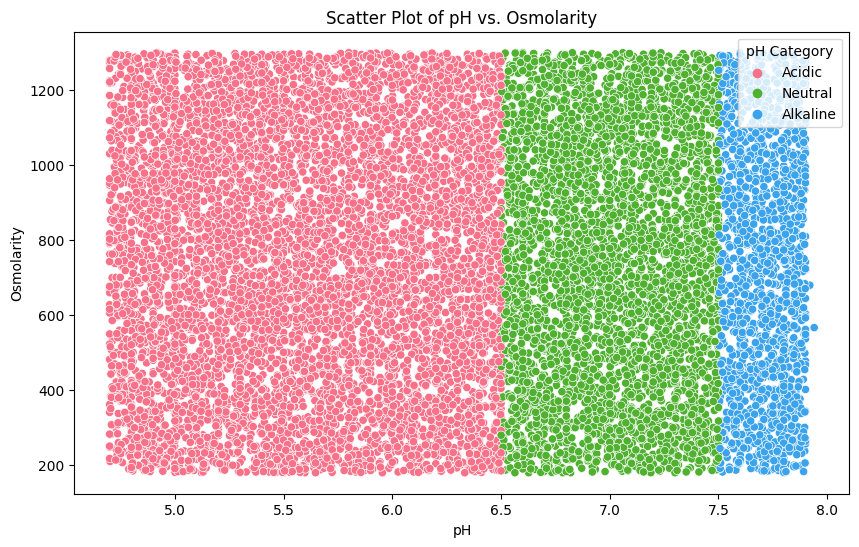

In [100]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df2, x='pH', y='osmolarity', hue='pH Category', palette='husl')
plt.title('Scatter Plot of pH vs. Osmolarity')
plt.xlabel('pH')
plt.ylabel('Osmolarity')
plt.legend(title='pH Category')
plt.show()


* From the scatter plot, we observe a slight positive correlation between pH and osmolarity.
* The distribution of data points across pH categories indicates that osmolarity tends to vary across different pH categories, with acidic and alkaline categories exhibiting wider ranges compared to the neutral category.

* There seems to be no significant correlation between specific gravity and urea concentration.
* The distribution of data points across pH categories indicates that specific gravity and urea concentration vary independently of each other and across different pH categories.

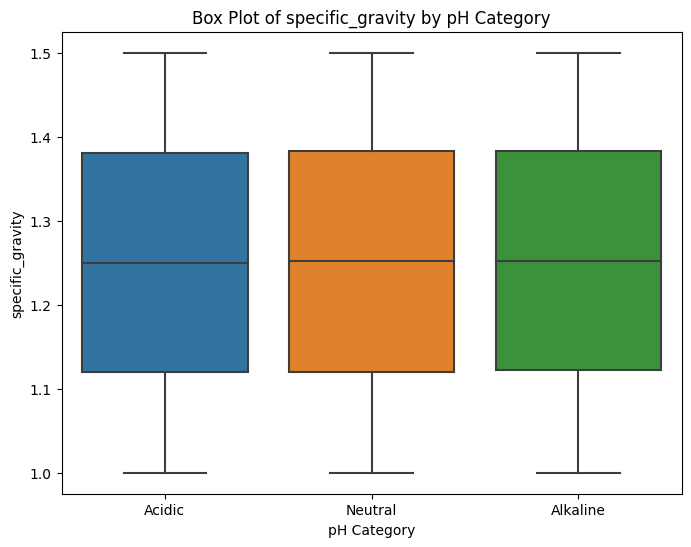

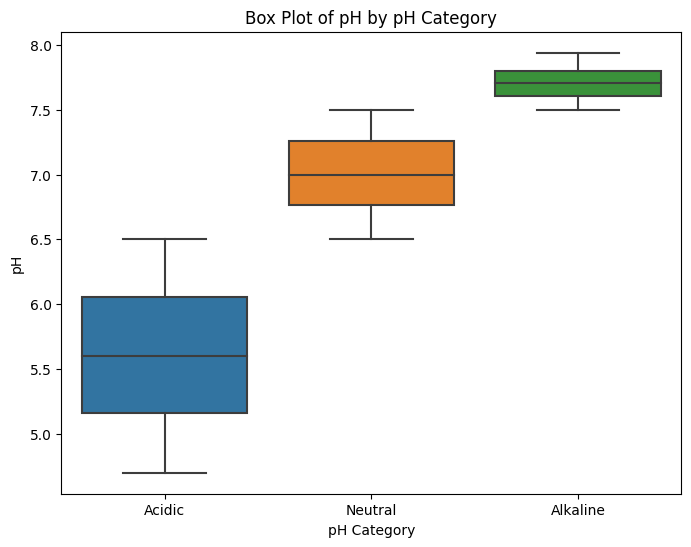

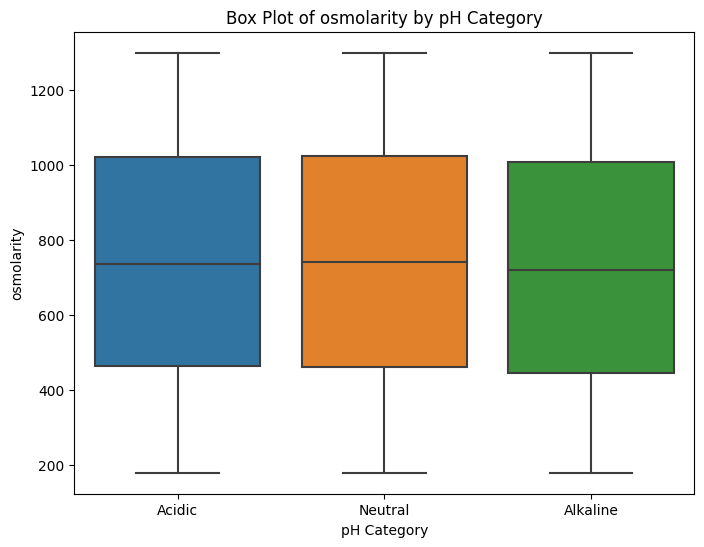

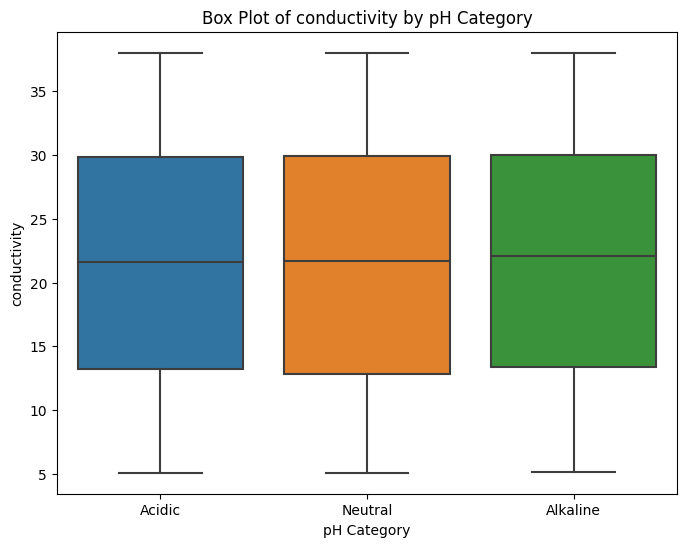

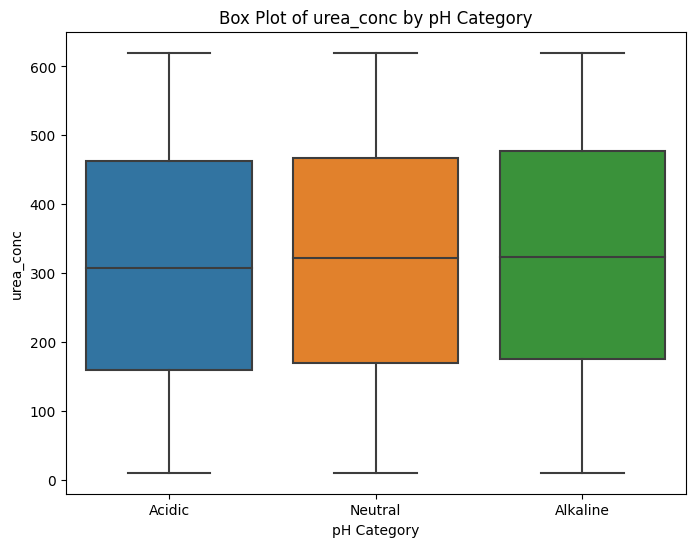

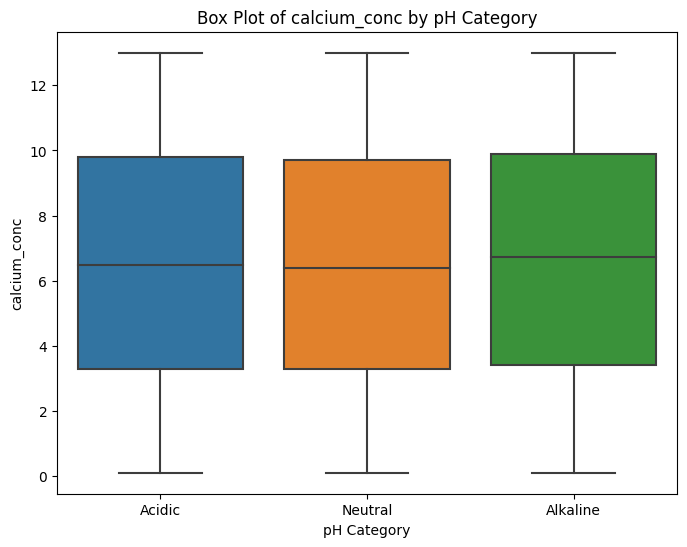

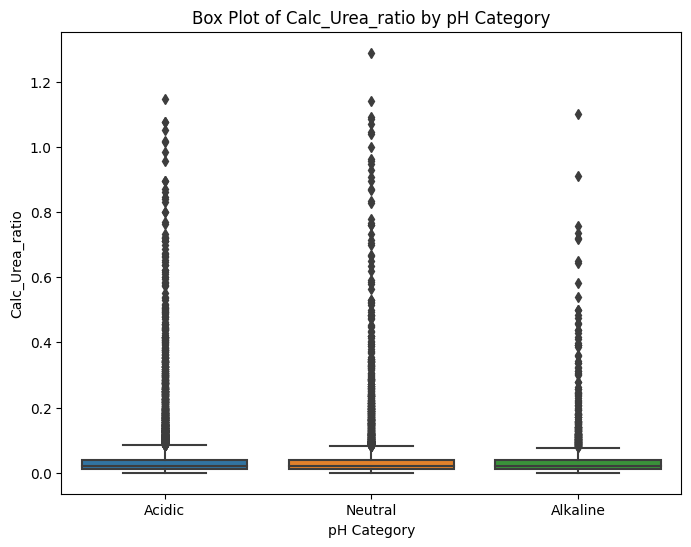

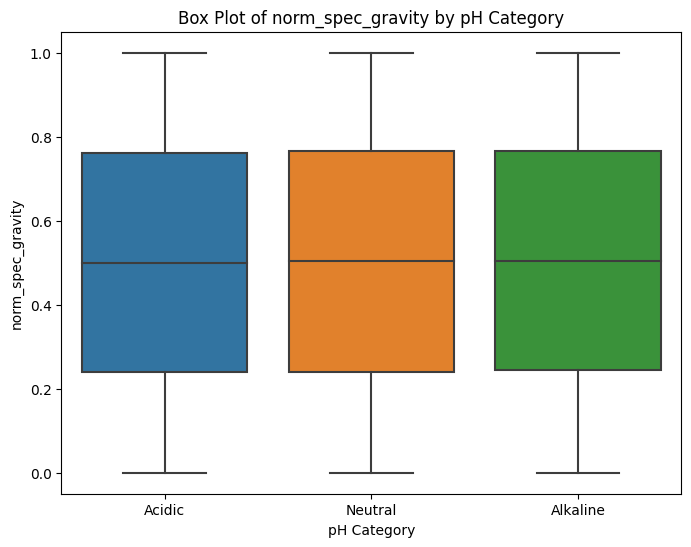

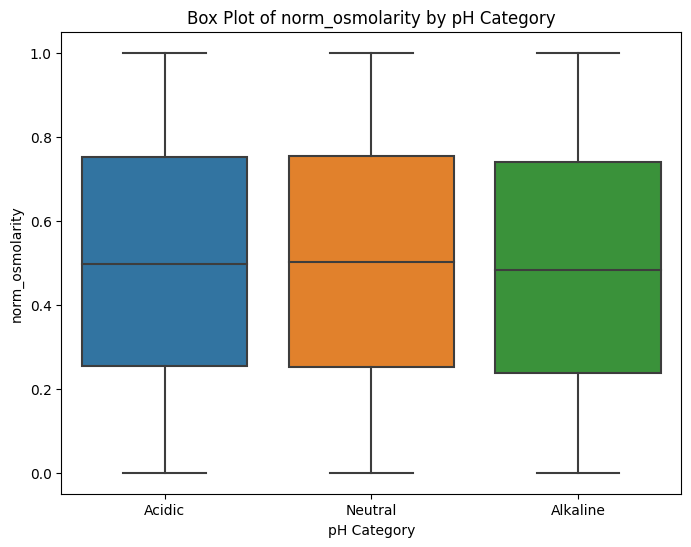

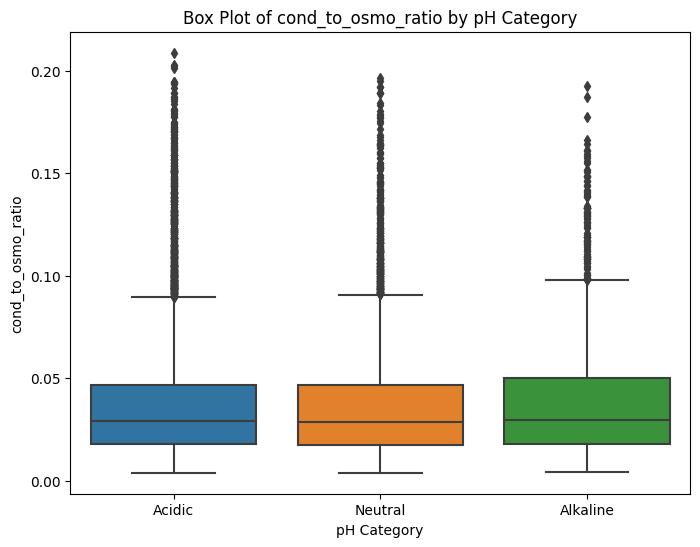

In [101]:
for column in df2.select_dtypes(include='number'):
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=df2, x='pH Category', y=column)
    plt.title(f'Box Plot of {column} by pH Category')
    plt.show()


<Figure size 1000x600 with 0 Axes>

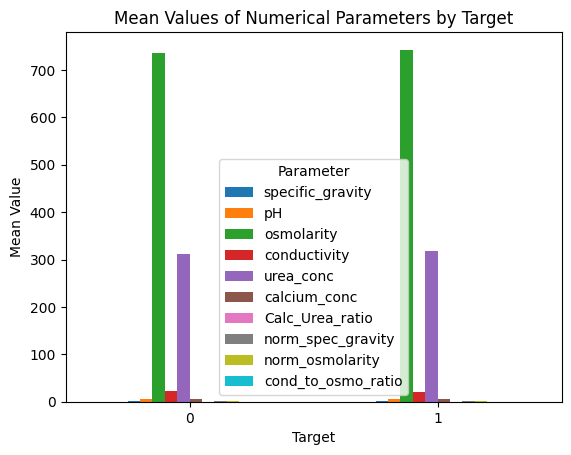

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group by 'target' and calculate the mean for each numerical column
mean_values = df2.groupby('target').mean()

# Plotting
plt.figure(figsize=(10, 6))
mean_values.plot(kind='bar')
plt.title('Mean Values of Numerical Parameters by Target')
plt.xlabel('Target')
plt.ylabel('Mean Value')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.legend(title='Parameter')  # Add legend with parameter names
plt.show()


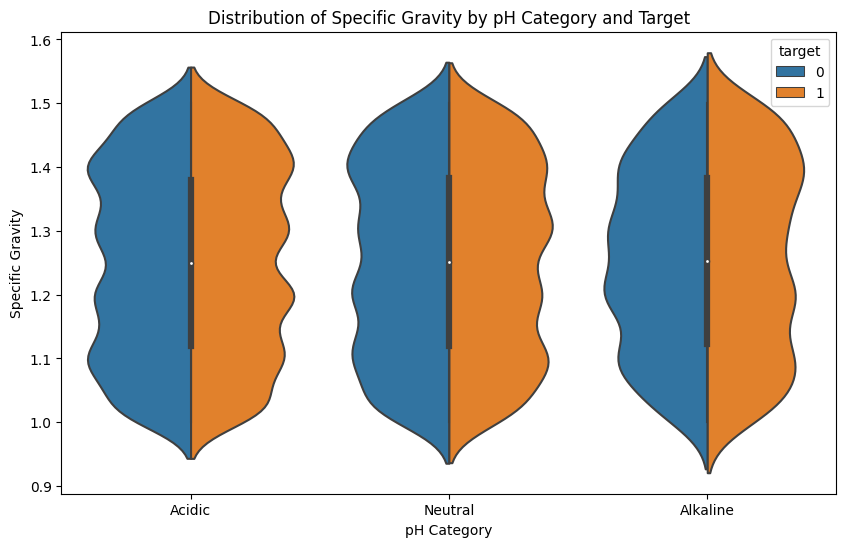

In [103]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='pH Category', y='specific_gravity', data=df2, hue='target', split=True)
plt.title('Distribution of Specific Gravity by pH Category and Target')
plt.xlabel('pH Category')
plt.ylabel('Specific Gravity')
plt.show()


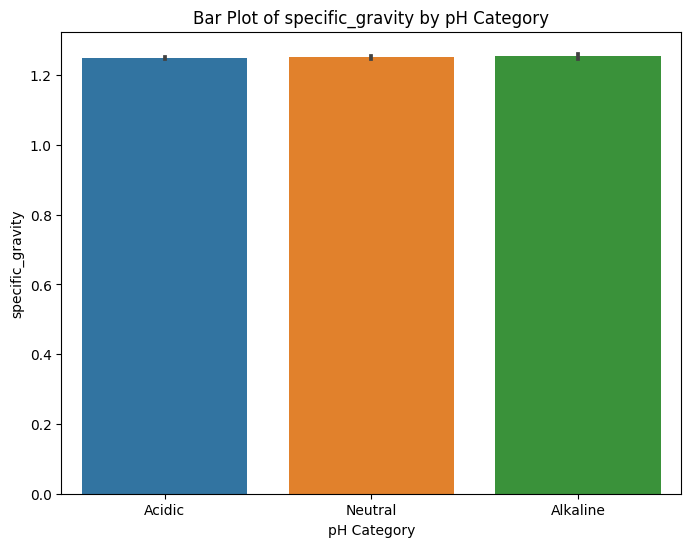

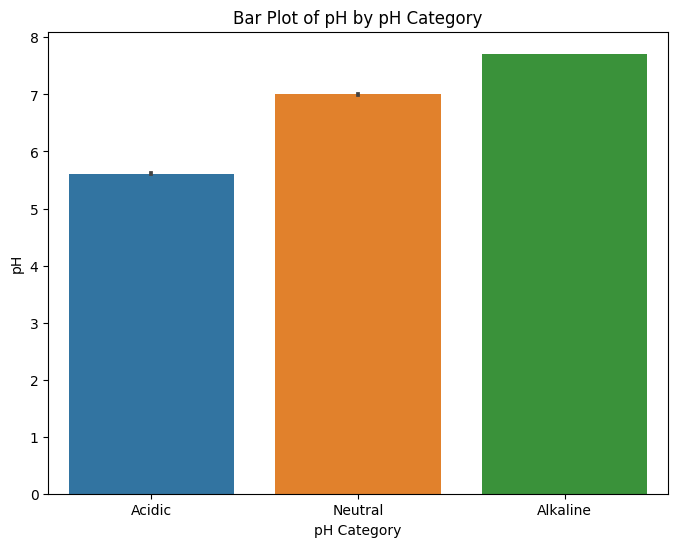

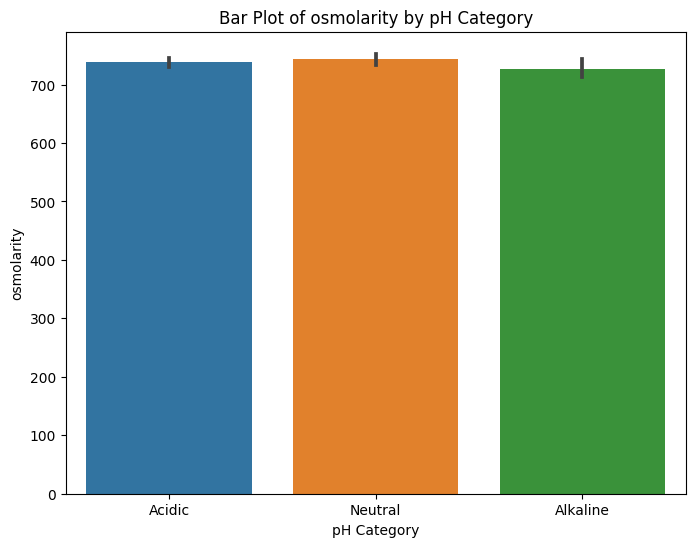

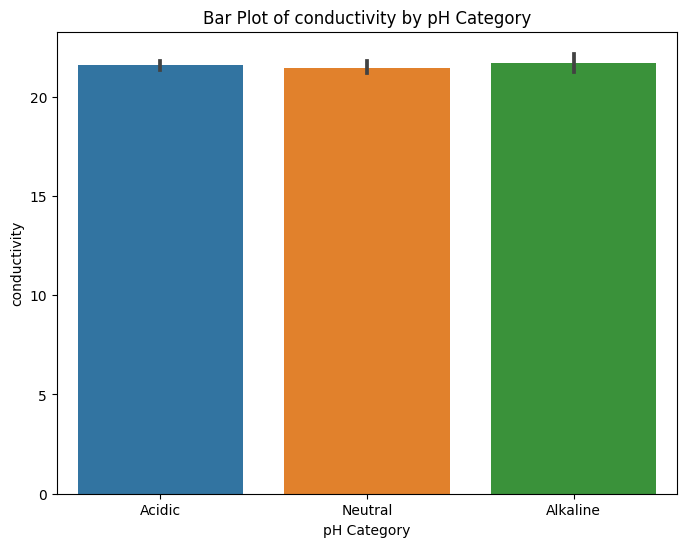

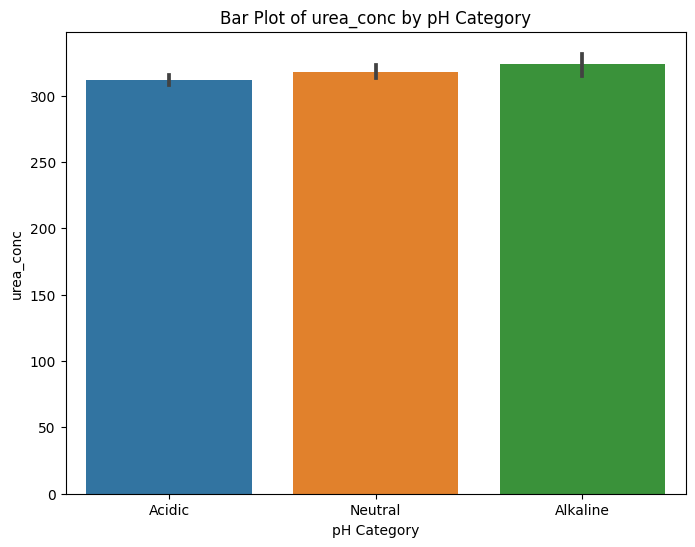

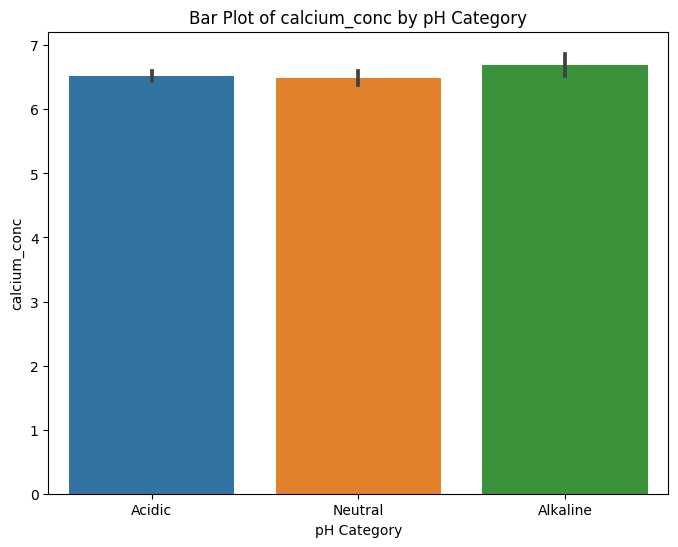

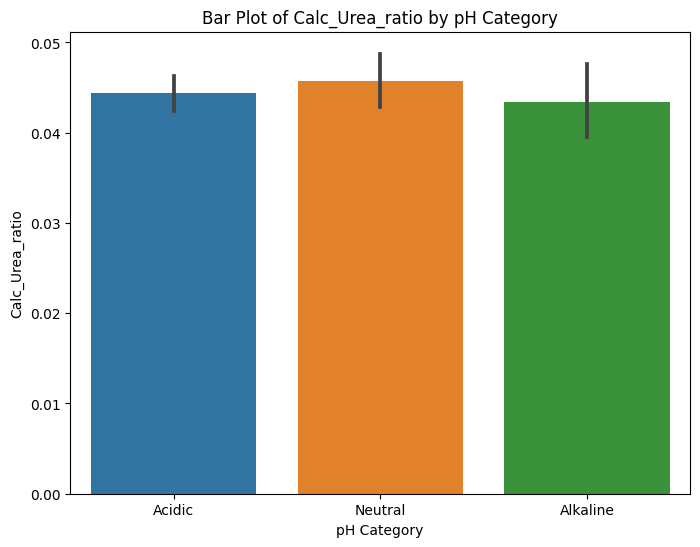

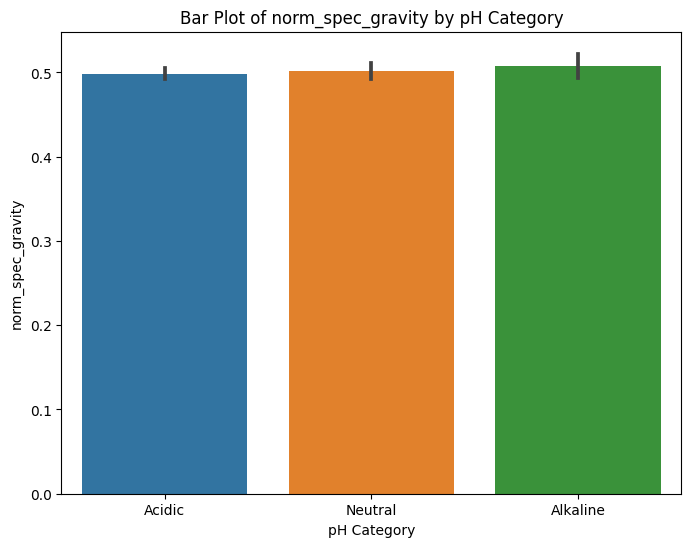

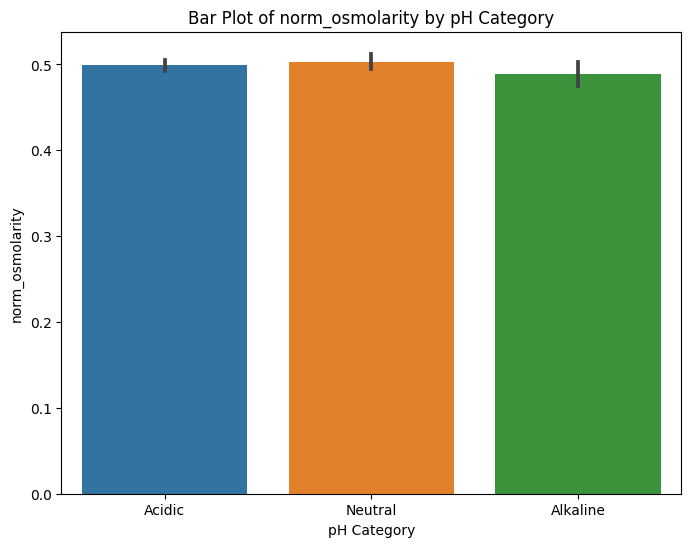

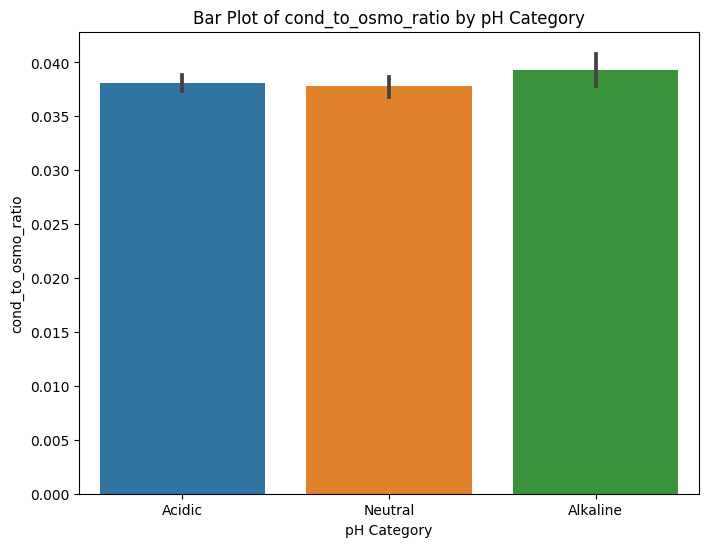

In [104]:
for column in df2.select_dtypes(include='number'):
    plt.figure(figsize=(8, 6))
    sns.barplot(data=df2, x='pH Category', y=column)
    plt.title(f'Bar Plot of {column} by pH Category')
    plt.show()


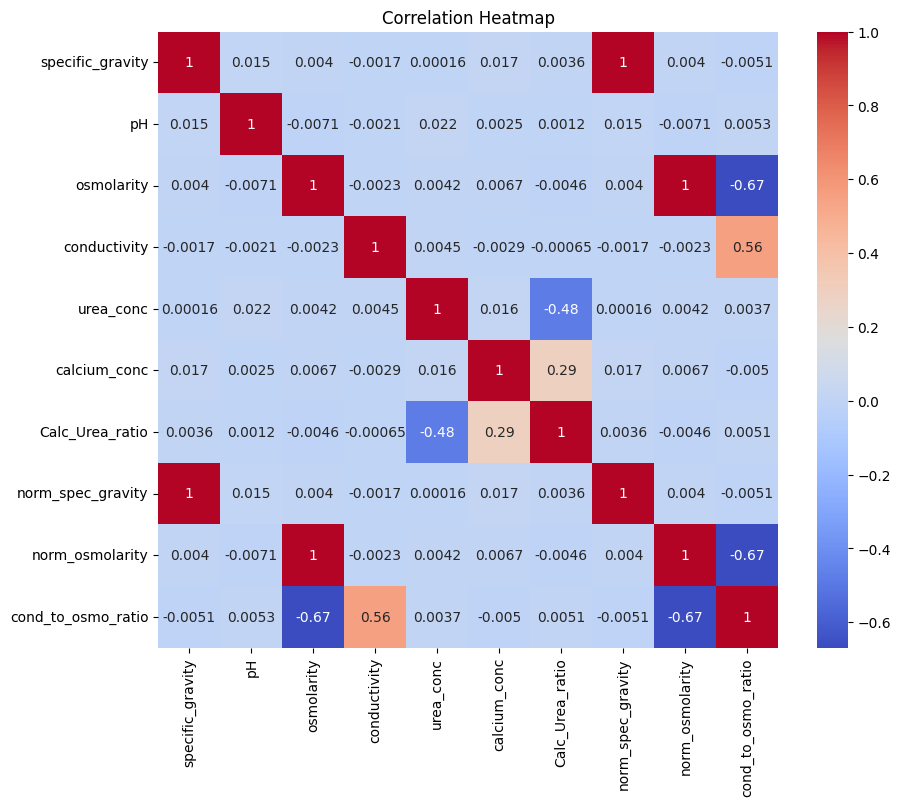

In [105]:
plt.figure(figsize=(10, 8))
sns.heatmap(df2.select_dtypes(include='number').corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


# Multi-Variate Analysis

In [106]:
#Non-Visual Multivariate Analysis

# 1. Correlation Analysis
correlation_matrix = df2.select_dtypes(include='number').corr()
pd.DataFrame(correlation_matrix)

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio
specific_gravity,1.000000,0.014737,0.003989,-0.001653,0.000162,0.016934,0.003554,1.000000,0.003989,-0.005134
pH,0.014737,1.000000,-0.007081,-0.002142,0.021629,0.002478,0.001247,0.014737,-0.007081,0.005256
osmolarity,0.003989,-0.007081,1.000000,-0.002253,0.004151,0.006670,-0.004600,0.003989,1.000000,-0.668848
conductivity,-0.001653,-0.002142,-0.002253,1.000000,0.004472,-0.002927,-0.000650,-0.001653,-0.002253,0.555933
urea_conc,0.000162,0.021629,0.004151,0.004472,1.000000,0.015820,-0.480789,0.000162,0.004151,0.003729
calcium_conc,0.016934,0.002478,0.006670,-0.002927,0.015820,1.000000,0.291889,0.016934,0.006670,-0.004957
Calc_Urea_ratio,0.003554,0.001247,-0.004600,-0.000650,-0.480789,0.291889,1.000000,0.003554,-0.004600,0.005117
norm_spec_gravity,1.000000,0.014737,0.003989,-0.001653,0.000162,0.016934,0.003554,1.000000,0.003989,-0.005134
norm_osmolarity,0.003989,-0.007081,1.000000,-0.002253,0.004151,0.006670,-0.004600,0.003989,1.000000,-0.668848
cond_to_osmo_ratio,-0.005134,0.005256,-0.668848,0.555933,0.003729,-0.004957,0.005117,-0.005134,-0.668848,1.000000


In [107]:
# Multivariate analysis using groupby
grouped_mean = df2.groupby('pH Category').mean()
grouped_median = df2.groupby('pH Category').median()

# Multivariate analysis using crosstab
cross_tab = pd.crosstab(index=df2['pH Category'], columns=df2['target'])

# # Display the results
# print("Grouped Mean:")
# print(grouped_mean)
# print("\nGrouped Median:")
# print(grouped_median)
# print("\nCross Tabulation:")
# print(cross_tab)


In [108]:
pd.DataFrame(cross_tab)

target,0,1
pH Category,,
Acidic,3650,3653
Neutral,2019,2044
Alkaline,797,789


In [109]:
pd.DataFrame(grouped_mean)

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio
pH Category,,,,,,,,,,
Acidic,1.249338,5.608269,738.835821,21.576423,311.521156,6.519457,0.044347,0.498677,0.498961,0.038085
Neutral,1.250852,7.006445,743.316023,21.465775,317.919518,6.491532,0.0457,0.501704,0.502961,0.037772
Alkaline,1.254037,7.707913,727.258512,21.692423,323.533417,6.689520,0.043449,0.508075,0.488624,0.039294


In [110]:
pd.DataFrame(grouped_median)

,specific_gravity,pH,osmolarity,conductivity,urea_conc,calcium_conc,Calc_Urea_ratio,norm_spec_gravity,norm_osmolarity,cond_to_osmo_ratio
pH Category,,,,,,,,,,
Acidic,1.250000,5.600000,736.0,21.615126,308.0,6.48,0.020884,0.500000,0.496429,0.02933
Neutral,1.251500,7.000000,742.0,21.668503,322.0,6.40,0.019773,0.503000,0.501786,0.028937
Alkaline,1.252497,7.705074,719.5,22.073350,324.0,6.74,0.020162,0.504994,0.481696,0.029787


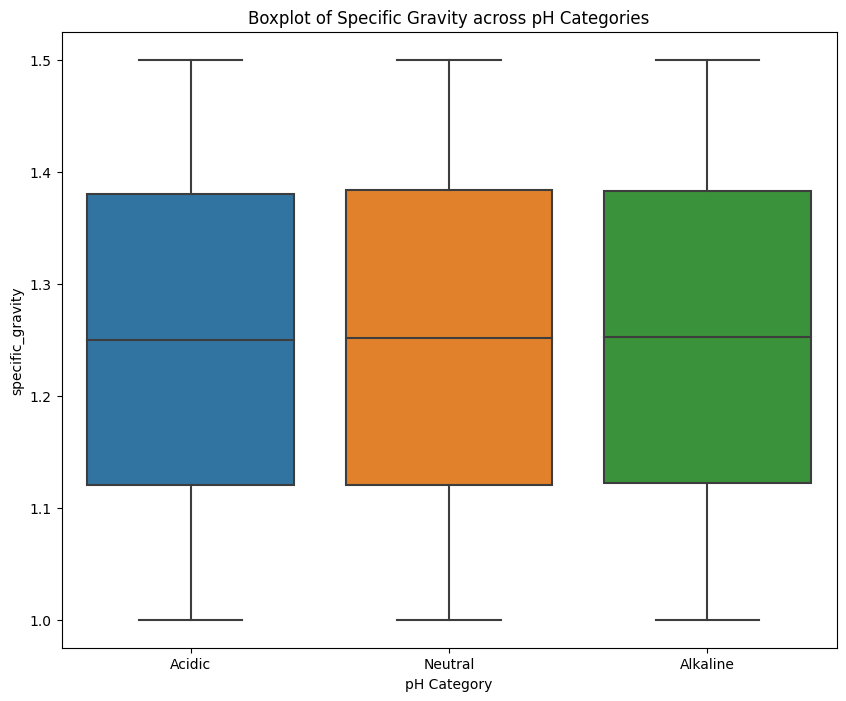

In [111]:
# 4. Boxplot
plt.figure(figsize=(10, 8))
sns.boxplot(x='pH Category', y='specific_gravity', data=df2)
plt.title('Boxplot of Specific Gravity across pH Categories')
plt.show()

<Figure size 1200x1000 with 0 Axes>

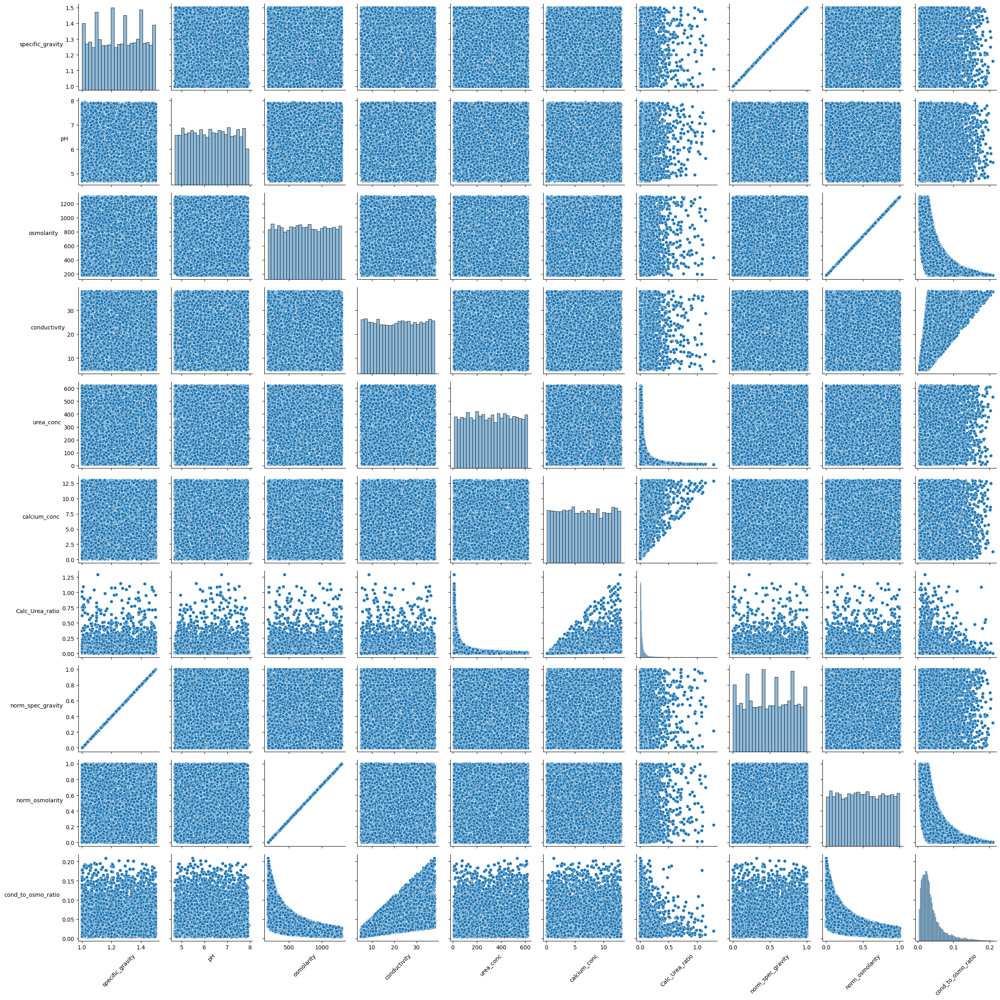

In [112]:
plt.figure(figsize=(12, 10))
scatter_matrix = sns.pairplot(df2.select_dtypes(include='number'), palette='Set1', diag_kind='hist', diag_kws={'alpha': 0.5})
for ax in scatter_matrix.axes.flat:
    ax.xaxis.label.set_rotation(45)  # Rotate x-axis label
    ax.yaxis.label.set_rotation(0)    # Keep y-axis label horizontal
    ax.yaxis.label.set_ha('right')    # Align y-axis label to right
plt.tight_layout()
plt.show()

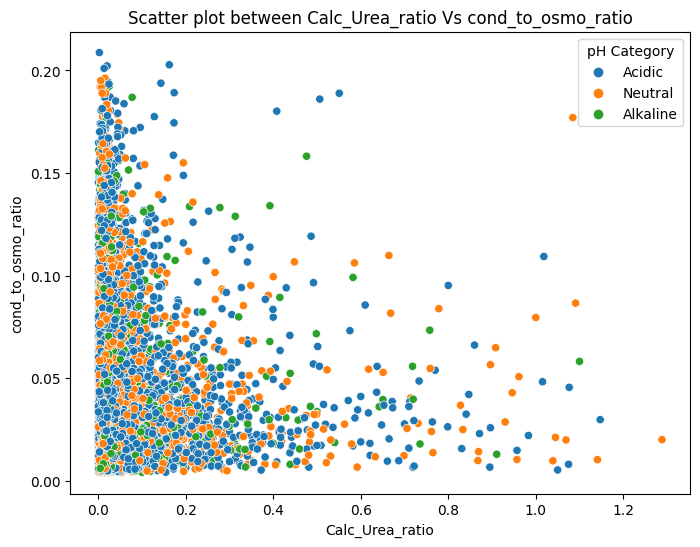

In [113]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df2, x="Calc_Urea_ratio",y="cond_to_osmo_ratio",hue='pH Category')  # Adjust the number of bins as needed
plt.title("Scatter plot between Calc_Urea_ratio Vs cond_to_osmo_ratio")
plt.show()

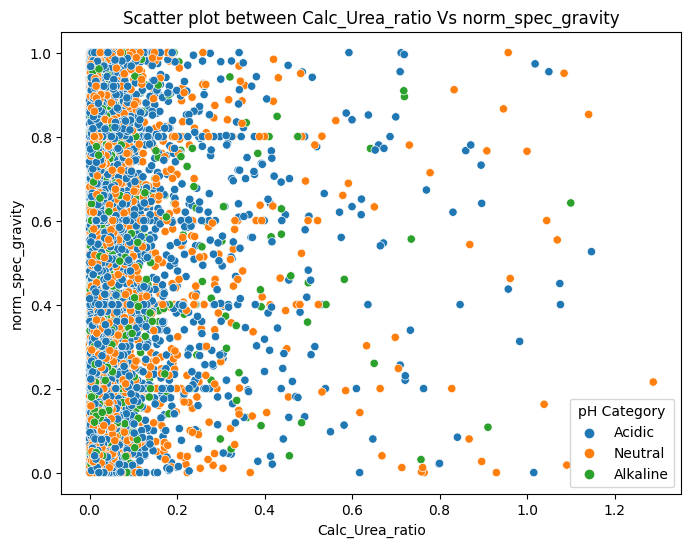

In [114]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df2, x="Calc_Urea_ratio",y="norm_spec_gravity",hue='pH Category')  # Adjust the number of bins as needed
plt.title("Scatter plot between Calc_Urea_ratio Vs norm_spec_gravity")
plt.show()

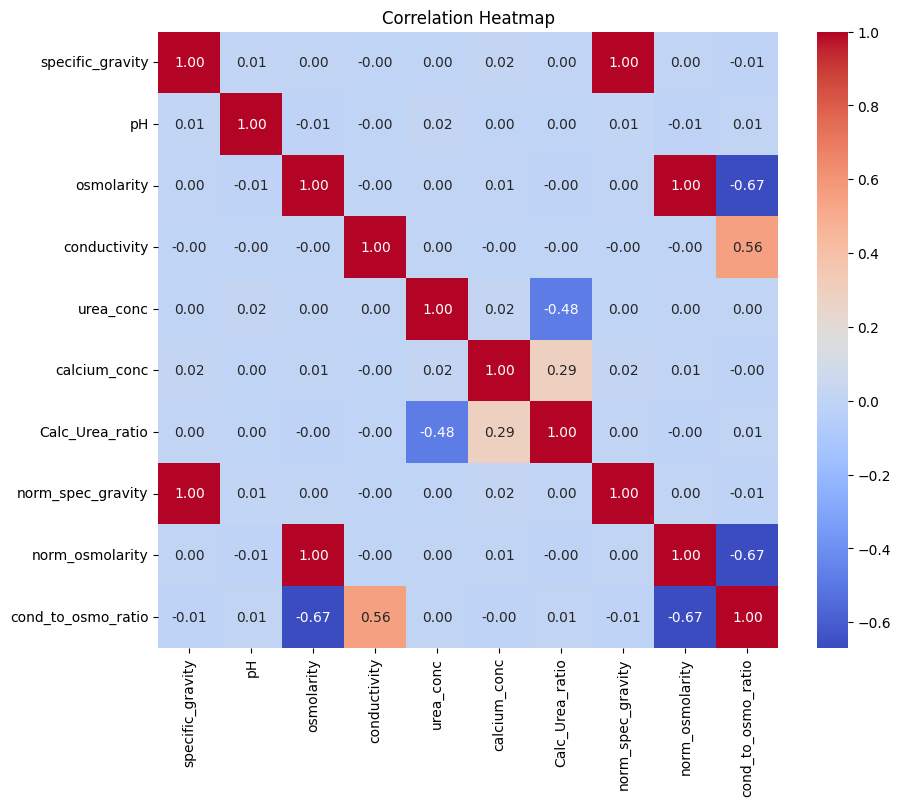

In [115]:
# 2. Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

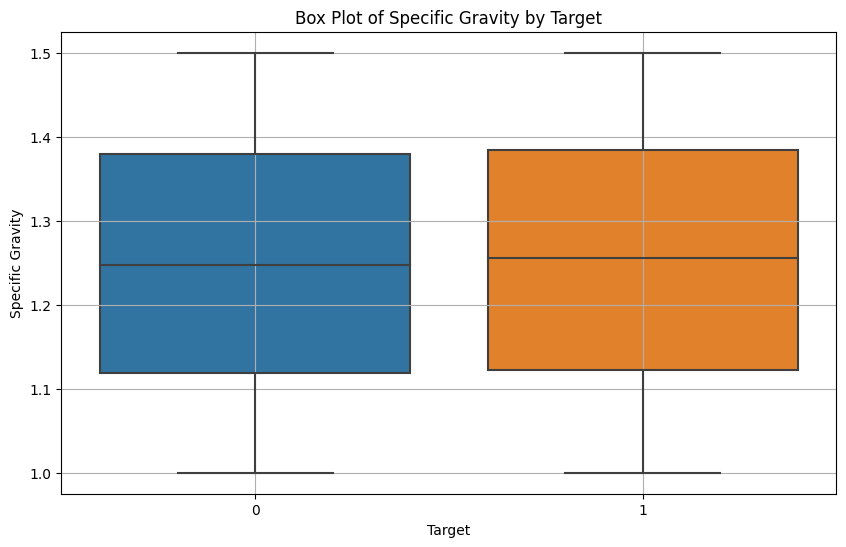

In [116]:
# Box plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df2, x='target', y='specific_gravity')
plt.title('Box Plot of Specific Gravity by Target')
plt.xlabel('Target')
plt.ylabel('Specific Gravity')
plt.grid(True)
plt.show()


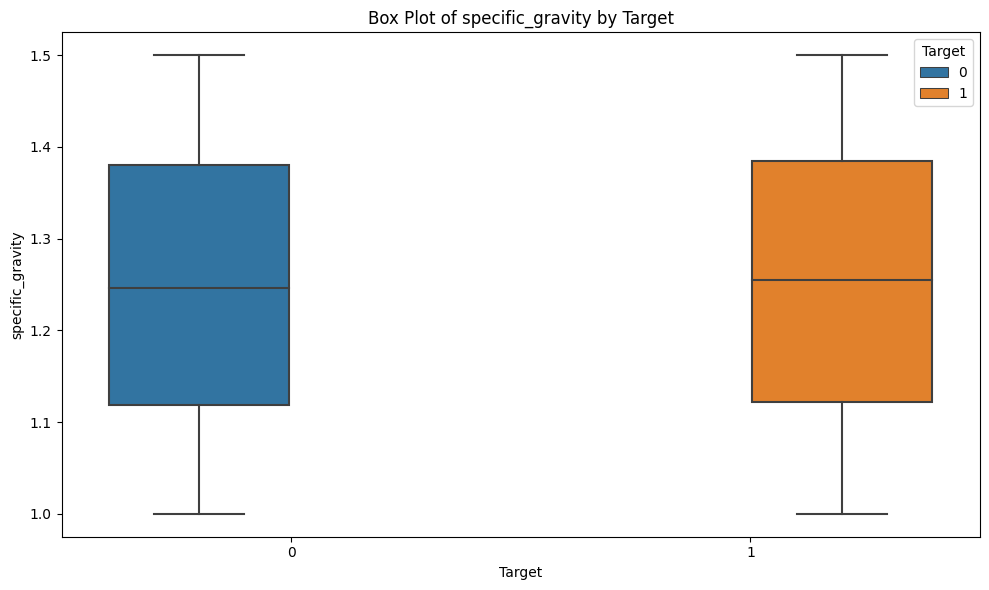

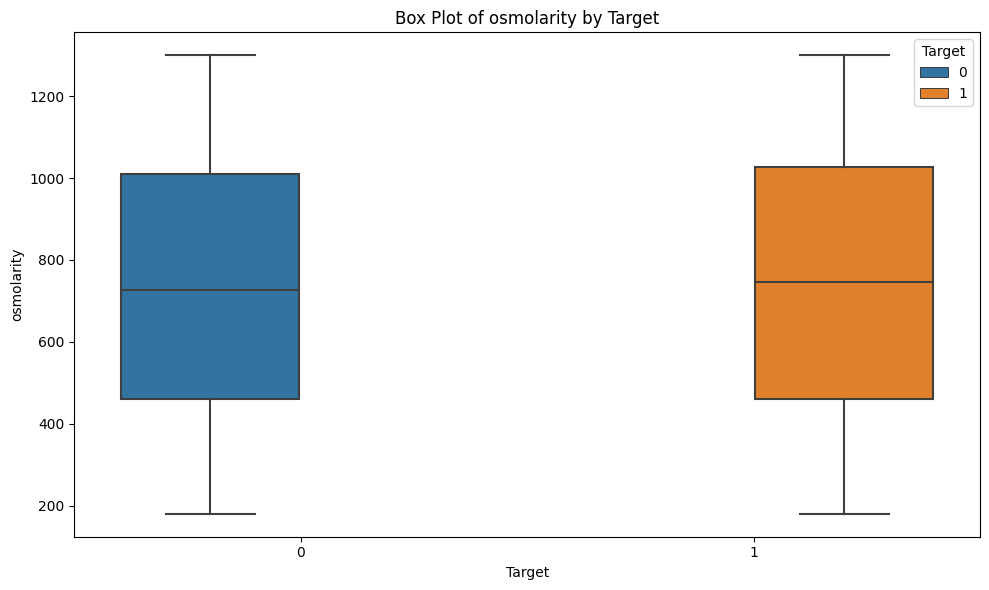

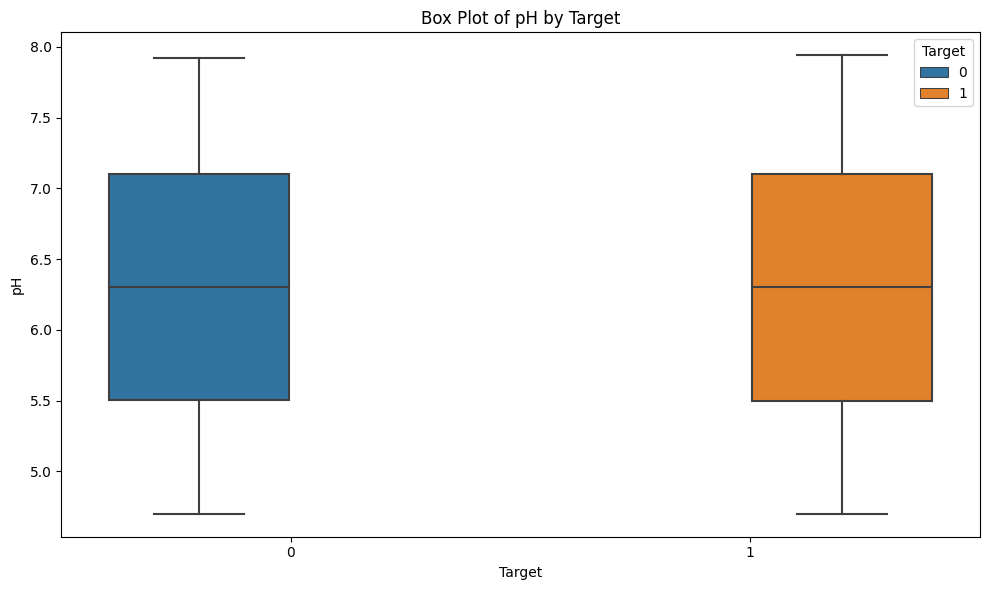

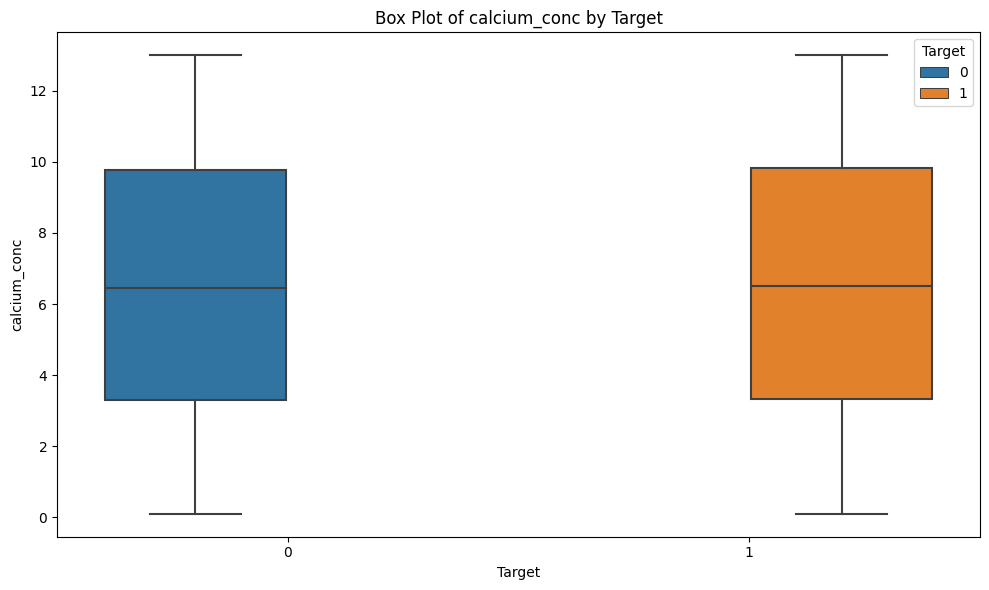

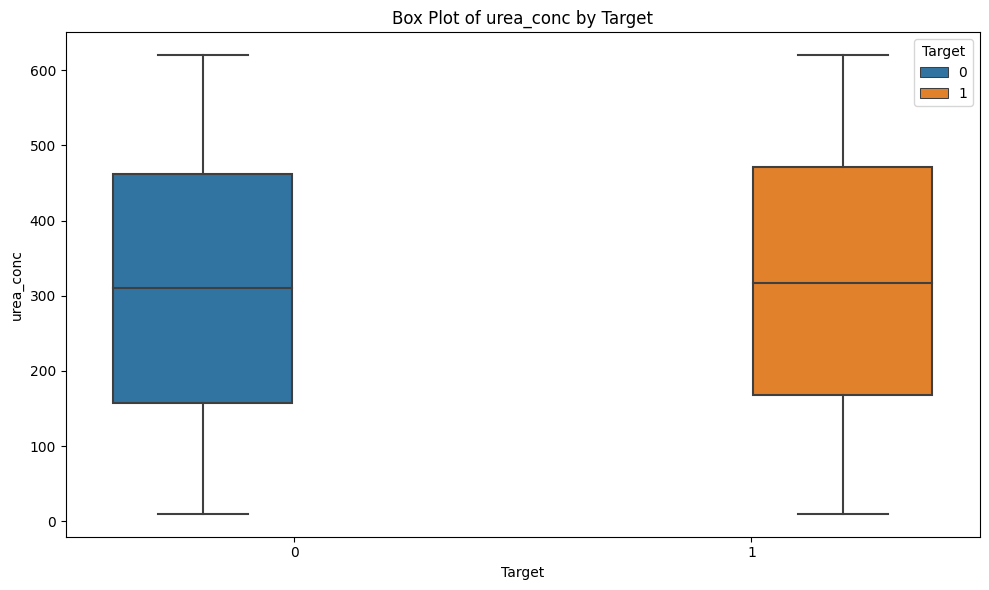

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt

# List of numerical columns
numerical_columns = ['specific_gravity', 'osmolarity', 'pH', 'calcium_conc', 'urea_conc']

# Assuming 'df' is your DataFrame with columns 'target' and the numerical columns
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    
    # Box Plot
    sns.boxplot(x='target', y=column, data=df2, hue='target')
    plt.title('Box Plot of {} by Target'.format(column))
    plt.xlabel('Target')
    plt.ylabel(column)
    plt.legend(title='Target')
    plt.tight_layout()
    plt.show()


* The box-plots shows how the 25%, 50%, 75% values lies between.